# Differential Evolution Optimization

---

    The downside is that GAs don’t natively support real valued (float values) cost functions. Sure, genetic algorithms can be modified to support float values, but in my experience it just isn’t worth it. This is where differential evolution comes it.

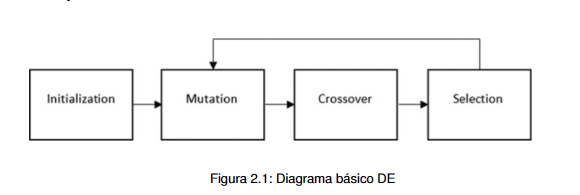

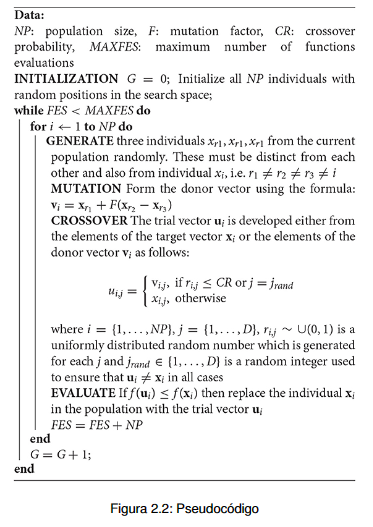


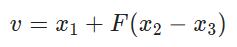

In [1]:
def grafica(mejores, peores, promedio, generaciones):
    x = list(range(1, generaciones+1))
    plt.scatter(x, mejores, color='green', label='mejor', s=10)
    plt.plot(x, mejores, color='green')
    plt.scatter(x, peores, color='red', label='peor', s=10)
    plt.plot(x, peores, color='red')
    plt.scatter(x, promedio, color='blue', label='promedio', s=10)
    plt.plot(x, promedio, color='blue')
    plt.legend()
    plt.xlabel('Generaciones')
    plt.ylabel('Aptitud')
    plt.title("Gráfica de convergencia")
    plt.show()

## En Problemas Continuos:

In [2]:
import random


def ensure_bounds(vec, bounds):

    vec_new = []
    # cycle through each variable in vector 
    for i in range(len(vec)):

        # variable exceedes the minimum boundary
        if vec[i] < bounds[i][0]:
            vec_new.append(bounds[i][0])

        # variable exceedes the maximum boundary
        if vec[i] > bounds[i][1]:
            vec_new.append(bounds[i][1])

        # the variable is fine
        if bounds[i][0] <= vec[i] <= bounds[i][1]:
            vec_new.append(vec[i])
        
    return vec_new


def DE(cost_func, bounds, popsize, mutate, recombination, maxiter):
    mejores = []
    peores = []
    promedios = []

    # INITIZALIZATION
    
    population = []
    for i in range(0,popsize):
        indv = []
        for j in range(len(bounds)):
            indv.append(random.uniform(bounds[j][0],bounds[j][1]))
        population.append(indv)
            
    
            
            
    for i in range(1,maxiter+1):
        print (f"\n\nGENERATION:{i} \n")
        gen_scores = [] # score of the actual Generation (Average, Best, worst, ...)

        # cycle through each individual in the population   THIS PART COULD BE STOCHASTIC
        for j in range(0, popsize):

            # MUTATION 
            
            candidates = [i for i in range(popsize)]
            
            candidates.remove(j) # Not the actual value
            
            
            random_index = random.sample(candidates, 3)

            x_1 = population[random_index[0]]
            x_2 = population[random_index[1]]
            x_3 = population[random_index[2]]
            x_t = population[j]     # target individual


            # subtract x3 from x2, and create a new vector (x_diff)
            x_diff = [x_2_i - x_3_i for x_2_i, x_3_i in zip(x_2, x_3)]

            
#             print(x_1)
#             print(x_2)
#             print(x_3)
#             print(x_t)
#             print(x_diff)
            
            # multiply x_diff by the mutation factor (F) and add to x_1
            v_donor = [x_1_i + mutate * x_diff_i for x_1_i, x_diff_i in zip(x_1, x_diff)]
            v_donor = ensure_bounds(v_donor, bounds)

            #--- RECOMBINATION (step #3.B) ----------------+

            v_trial = [] #Vector juicio :)
#             print('XT: ',x_t)
            for k in range(len(x_t)):
#                 print(k)
                crossover = random.random()
#                 print(crossover)
                if crossover <= recombination:
                    v_trial.append(v_donor[k])

                else:
                    v_trial.append(x_t[k])
            
#             print('TRIAL: ', v_trial)
            #--- GREEDY SELECTION (step #3.C) -------------+

            score_trial  = cost_func(v_trial)
            score_target = cost_func(x_t)

            if score_trial < score_target:
                population[j] = v_trial
                gen_scores.append(score_trial)
                print( '   >',score_trial, v_trial)

            else:
                print( '   >',score_target, x_t)
                gen_scores.append(score_target)

        #--- SCORE KEEPING --------------------------------+

        gen_avg = sum(gen_scores) / popsize                         # current generation avg. fitness
        gen_best = min(gen_scores)                                  # fitness of best individual
        gen_sol = population[gen_scores.index(min(gen_scores))]     # solution of best individual
        gen_worst = max(gen_scores)

        print('      > GENERATION AVERAGE:',gen_avg)
        print('      > GENERATION BEST:',gen_best)
        print('         > BEST SOLUTION:',gen_sol,'\n')
        
        mejores.append(gen_best)
        peores.append(gen_worst)
        promedios.append(gen_avg)

        
        
    return gen_sol, mejores, peores, promedios




### Ackley:

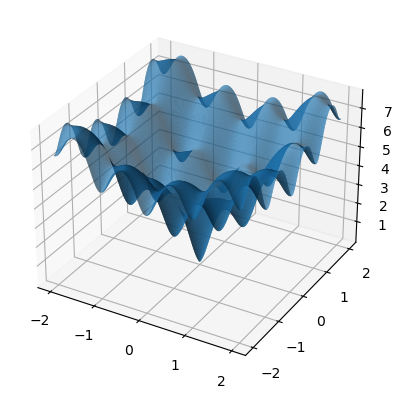

In [3]:
from All_functions import ackley
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

X = np.linspace(-2, 2, 400)
Y = np.linspace(-2, 2, 400)
X, Y = np.meshgrid(X, Y)
Z = ackley([X,Y])

fig = plt.figure()

ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, linewidth=0.08,
  antialiased=True)

plt.show()

In [4]:

cost_func = ackley                  # Cost function
bounds = [(-2,2),(-2,2), (-2,2)]            # Bounds [(x1_min, x1_max), (x2_min, x2_max),...]
popsize = 10                        # Population size, must be >= 4
mutate = 0.5                        # Mutation factor [0,2]
recombination = 0.7                 # Recombination rate [0,1]
maxiter = 20     


sol, mejores, peores, promedios = DE(cost_func, bounds, popsize, mutate, recombination, maxiter)




GENERATION:1 

   > 7.686975981443412 [1.88454945407954, -1.6617523085140626, 1.5069145247477231]
   > 6.5443363882886345 [1.530402431378287, 1.322563786569427, 0.4899057814671055]
   > 5.000809202776594 [-0.2197364767840213, -1.596543502301563, 0.0460004261789666]
   > 2.5560749497099597 [0.029909247648475024, 0.5259921148613633, -0.06824227985086484]
   > 3.501884169455583 [0.35807821453843003, 0.8196224188185042, -0.11770308286231357]
   > 5.202441140400158 [1.5766666409207533, -0.8421359707670963, 0.009366932161594788]
   > 2.764172764665464 [-0.1506498757163084, 0.4307866506703615, 0.17250587224740377]
   > 4.916243524136636 [0.5305101150808846, -1.1982576664475313, 0.3250744568379518]
   > 5.62843177238566 [-0.4700369105002261, -1.7731357677588626, -0.1506579421654417]
   > 6.648911492094683 [1.6159596264349059, -1.9635466961408663, 1.027333130333239]
      > GENERATION AVERAGE: 5.045028138535678
      > GENERATION BEST: 2.5560749497099597
         > BEST SOLUTION: [0.029909247

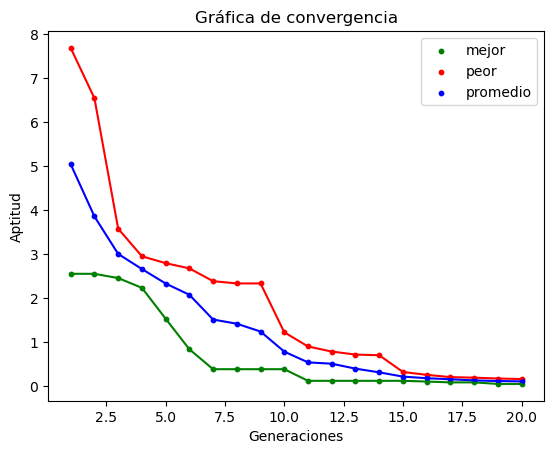

In [5]:
grafica(mejores, peores, promedios, maxiter)

### Griewank:

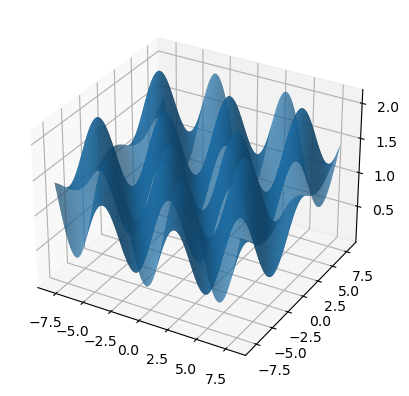

In [8]:
from All_functions import griewank
X = np.linspace(-8, 8, 400)
Y = np.linspace(-8, 8, 400)
X, Y = np.meshgrid(X, Y)
Z = griewank([X,Y])


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, linewidth=0.08,
  antialiased=True)
plt.show()

In [10]:
cost_func = griewank               # Cost function
bounds = [(-2,2),(-2,2), (-2,2)]            # Bounds [(x1_min, x1_max), (x2_min, x2_max),...]
popsize = 10                        # Population size, must be >= 4
mutate = 0.5                        # Mutation factor [0,2]
recombination = 0.7                 # Recombination rate [0,1]
maxiter = 20     


sol, mejores, peores, promedios = DE(cost_func, bounds, popsize, mutate, recombination, maxiter)




GENERATION:1 

   > 0.8340768432809837 [0.6675670245250025, 1.7565463499502756, -1.3594492066970192]
   > 0.8597424946908969 [-0.529594193252904, -1.9672111453140682, -0.3614414987445089]
   > 0.5240475935563061 [-0.668913732054929, 0.7473861285509469, 1.3459963278079115]
   > 0.054809469597659755 [-0.012431373123886758, -0.007518433646486855, 0.5713032723900773]
   > 0.4515194631900158 [-0.9606013790808148, -0.38444035797679765, 0.09360816869913702]
   > 0.924466422429114 [1.407944019428323, -1.3937171682883625, 0.4937158934298398]
   > 0.6673257179022883 [0.405640197297386, -1.1127209561380602, 1.7531800528741668]
   > 0.533712273974391 [0.09497930156623857, -0.6715186593118001, 1.7398430879158688]
   > 0.011764306711887884 [-0.040717434198493496, 0.12707820278964066, 0.2019680764421352]
   > 0.762520627879351 [-0.4565687102140976, -1.531428312028209, -1.6167066156495604]
      > GENERATION AVERAGE: 0.5623985213212895
      > GENERATION BEST: 0.011764306711887884
         > BEST SO

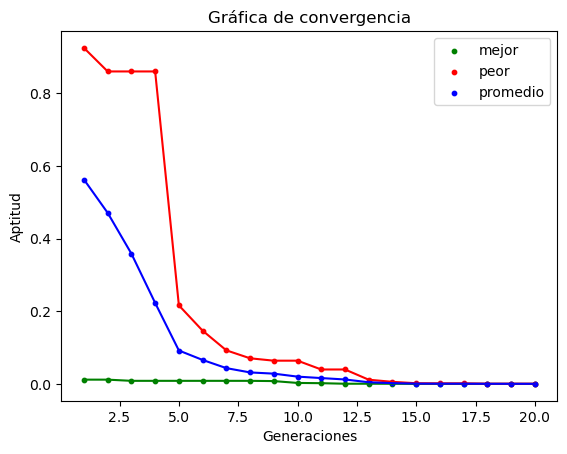

In [11]:
grafica(mejores, peores, promedios, maxiter)

---

## En Problemas Discretos:

In [12]:
import math
import numpy as np
import matplotlib.pyplot as plt
import random
import tsplib95

# --- FUNCTIONS ---------------------------------------------------------------+

def funcion(permutacion):
    suma = 0
    for i in range(len(permutacion)-1):
        nodoA = permutacion[i]
        nodoB = permutacion[i+1]
        distancia = tsp.edges[nodoA, nodoB]['weight']
        suma += distancia
    nodoFinal = permutacion[-1]
    nodoInicial = permutacion[0]
    distancia = tsp.edges[nodoFinal, nodoInicial]['weight']
    return suma

def order_crossover(p1, p2):
    start = random.randint(0, len(p1) - 1)
    end = random.randint(start, len(p1))
    sub_cadena = p1[start:end]
    hijo = [0] * len(p1)
    hijo[start:end] = sub_cadena
    p2_sin_subcadena = [valor for valor in p2 if valor not in sub_cadena]
    index = 0
    for i in range(len(hijo)):
        if hijo[i] == 0:
            hijo[i] = p2_sin_subcadena[index]
            index += 1
    return hijo

def mutate_tsp(solution):
    index1, index2 = random.sample(range(len(solution)), 2)
    mutated_solution = solution.copy()
    mutated_solution[index1], mutated_solution[index2] = mutated_solution[index2], mutated_solution[index1]
    return mutated_solution

# --- MAIN -------------------------------------------------------------------+

def main(cost_func, bounds, popsize, mutate, recombination, maxiter, ciudades):
    print(ciudades)
    population = []
    for _ in range(0, popsize):
        ruta_aleatoria = np.random.permutation(ciudades)
        population.append(ruta_aleatoria)
    print(population)

    mejores = []
    peores = []
    promedio = []

    for i in range(1, maxiter+1):
        print('GENERATION:', i)
        gen_scores = []

        for j in range(0, popsize):
            canidates = list(range(0, popsize))
            canidates.remove(j)
            random_index = random.sample(canidates, 1)
            x_1 = population[random_index[0]]
            x_t = population[j]     
            v_donor = mutate_tsp(x_1)
            hijo = order_crossover(v_donor, x_t)
            score_trial  = cost_func(hijo)
            score_target = cost_func(x_t)

            if score_trial < score_target:
                population[j] = hijo
                gen_scores.append(score_trial)
                print('   >', score_trial, hijo)
            else:
                print('   >', score_target, x_t)
                gen_scores.append(score_target)

        gen_avg = sum(gen_scores) / popsize
        gen_best = min(gen_scores)   
        gen_worst = max(gen_scores)                              
        gen_sol = population[gen_scores.index(min(gen_scores))]

        mejores.append(gen_best)
        peores.append(gen_worst)
        promedio.append(gen_avg)

    print('\n\n\n BEST SOLUTION:', gen_sol, '\n')
    return mejores, peores, promedio



problem = tsplib95.load(r".\berlin52.tsp")
tsp = problem.get_graph()
print(f"DATOS: {tsp}")

ciudades = tsp.nodes
numeroVariables = len(ciudades)
limiteSuperior = 1
limiteInferior = len(ciudades)
bounds = []

for x in range(numeroVariables):
    bounds.append((limiteInferior, limiteSuperior))

cost_func = funcion                   
popsize = 500                      
mutate = 0.5                        
recombination = 0.7                 
maxiter = 100                       

mejores, peores, promedio = main(cost_func, bounds, popsize, mutate, recombination, maxiter, ciudades)


DATOS: Graph named 'berlin52' with 52 nodes and 1378 edges
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]
[array([ 7,  5, 37, 36, 43, 31, 51,  6, 35, 18, 52, 28, 10, 41, 29, 45, 26,
        2, 13,  8, 23, 16, 11, 12, 24, 47, 40,  1, 15, 14, 27, 44, 21, 25,
        3, 33, 22, 42, 17,  9, 49, 38, 34, 46, 19,  4, 32, 48, 50, 30, 20,
       39]), array([ 7, 20, 15, 50, 30, 44, 29, 28, 41, 45, 18, 49, 11, 17,  9, 43, 21,
       10, 35, 22, 37, 47,  3,  1, 48, 14, 16, 46, 52, 34,  2, 33,  4,  5,
       23,  6, 32, 39, 36, 19, 42, 31, 27, 13, 51, 40, 38, 26, 25,  8, 12,
       24]), array([52,  7, 30, 46, 35, 22, 27, 34, 38, 15, 39, 10, 18, 36, 31, 21,  3,
       51, 43, 28, 11, 33, 25, 48, 13,  8, 16, 17, 24, 42, 20,  2, 40,  5,
       12,  4, 50, 37, 23, 32,  1, 47, 19, 44,  6,  9, 26, 29, 14, 49, 45,
       41]), array([27, 41, 44, 39, 48,

   > 27831 [ 6 34 41  4 25 39  8 37 10 45  9 30 28 51  2 31 20 32 11 15 49 13 50 38
 44 52 16  5  3 24 33 43 40 35 12  7 27 14 36 19 26 47 46 17 48 42 29 23
  1 18 21 22]
   > 30747 [21 45 34 17 30 50  8 13  4  6 19 23 10 38 48 20 24 15 25 27 46 47 36 37
 51 18 44 49 32  2 33 41 28 43 14 29 22 26 31 12  3 11 40  5  7  9 16 35
 39  1 52 42]
   > 26571 [30, 37, 6, 28, 43, 45, 9, 34, 26, 25, 35, 39, 29, 7, 33, 5, 27, 47, 13, 21, 36, 17, 11, 18, 10, 19, 8, 32, 48, 49, 38, 16, 24, 51, 42, 14, 52, 46, 1, 50, 4, 44, 41, 2, 40, 15, 22, 31, 23, 20, 12, 3]
   > 28437 [27, 18, 33, 6, 38, 45, 35, 47, 1, 29, 30, 46, 34, 17, 2, 39, 7, 20, 37, 12, 4, 24, 22, 5, 43, 15, 31, 36, 32, 11, 3, 13, 44, 49, 16, 41, 28, 9, 48, 8, 19, 23, 42, 25, 50, 14, 26, 52, 21, 10, 40, 51]
   > 30663 [18, 31, 47, 34, 10, 5, 48, 22, 51, 7, 30, 38, 11, 17, 49, 52, 26, 9, 50, 39, 2, 45, 35, 36, 13, 42, 43, 24, 27, 41, 44, 4, 20, 29, 19, 8, 33, 32, 21, 15, 6, 28, 3, 23, 46, 16, 12, 40, 25, 37, 14, 1]
   > 27357 [26 19 38 36 1

   > 29818 [32 25 19  7 44 24  1 51 23 22  2 37 50 43 46  3 21 28 10  6 18 17 42 14
 13 41 45 33 48 36 27  5 47 40 30 34 49  9 26 31 29  8 38 52 16  4 35 20
 15 12 39 11]
   > 26095 [32, 30, 7, 52, 14, 25, 28, 48, 35, 21, 3, 5, 47, 39, 50, 22, 46, 49, 36, 24, 16, 11, 12, 43, 8, 42, 31, 44, 20, 18, 19, 4, 26, 33, 41, 6, 29, 13, 37, 38, 27, 10, 1, 9, 15, 17, 45, 2, 23, 51, 40, 34]
   > 27746 [50, 7, 8, 9, 52, 47, 48, 41, 37, 46, 25, 19, 26, 10, 28, 6, 39, 5, 30, 14, 29, 18, 22, 27, 12, 1, 4, 2, 38, 34, 24, 43, 23, 33, 17, 3, 31, 51, 15, 44, 42, 16, 20, 11, 13, 35, 32, 45, 40, 49, 36, 21]
   > 29060 [11 22  7 52 34 19 24 32 33 14 27 46 10 31 28 16 50 47 12  2 37 35 38  1
 44  8 29 23 26 30 51 42  3  5 25 49 15 36  9 43  6 40 48 39 41 17 13 21
 20  4 45 18]
   > 26371 [ 8 24 36 25  5 40 42 49 17 48 27 46 50  2 22 30  9  7 47 43 21 44 23 20
  1 39 38 52 33 11 51 45  6 16 34 29  3 18 26 28 41 32 31 12 35 37  4 13
 15 19 10 14]
   > 27933 [46, 2, 50, 13, 15, 42, 25, 41, 11, 12, 29, 36, 34, 26

   > 28971 [52 38 46 41 37 20 51 40 49 18  3 45 25 35 24 13 33 21 29 22 32 28  8  5
  9 11  1 39 31 23 43 12 34  6 47 50 48 44 19  4 42  2 26 10 27 15 17 36
  7 30 14 16]
   > 27284 [17, 4, 43, 22, 31, 49, 35, 30, 3, 36, 13, 9, 11, 52, 46, 8, 21, 18, 34, 50, 25, 1, 28, 33, 23, 29, 7, 26, 24, 15, 27, 48, 40, 5, 6, 39, 45, 10, 2, 38, 42, 37, 44, 12, 51, 41, 16, 32, 19, 47, 20, 14]
   > 25815 [32, 22, 24, 37, 28, 49, 10, 8, 41, 25, 33, 48, 17, 9, 39, 15, 12, 51, 38, 26, 13, 47, 3, 45, 1, 4, 35, 27, 30, 44, 18, 40, 36, 11, 14, 2, 29, 21, 6, 16, 20, 46, 19, 5, 7, 23, 52, 34, 31, 43, 50, 42]
   > 26849 [38, 35, 24, 45, 9, 52, 40, 8, 17, 41, 18, 30, 12, 34, 36, 25, 14, 39, 26, 28, 37, 31, 51, 47, 13, 44, 33, 46, 32, 1, 48, 50, 7, 19, 22, 43, 11, 23, 49, 42, 29, 15, 20, 21, 3, 10, 16, 4, 5, 6, 27, 2]
   > 27282 [7, 48, 34, 37, 52, 13, 16, 19, 32, 45, 12, 38, 27, 35, 2, 26, 36, 21, 28, 14, 23, 43, 25, 33, 15, 40, 1, 46, 24, 42, 41, 20, 9, 29, 31, 11, 44, 5, 4, 50, 30, 6, 18, 49, 39, 51, 47, 22,

   > 26896 [35, 44, 8, 40, 29, 28, 9, 18, 31, 41, 7, 42, 23, 11, 14, 27, 15, 38, 12, 5, 13, 21, 34, 26, 46, 32, 37, 24, 1, 2, 20, 49, 30, 51, 17, 19, 33, 36, 50, 10, 16, 47, 45, 3, 6, 39, 43, 22, 52, 25, 4, 48]
   > 25953 [41, 2, 42, 12, 38, 24, 45, 4, 18, 10, 28, 20, 50, 33, 40, 39, 11, 52, 6, 14, 9, 19, 32, 1, 26, 51, 27, 34, 30, 21, 15, 35, 16, 8, 25, 22, 13, 47, 23, 44, 49, 7, 29, 48, 37, 5, 3, 43, 36, 17, 31, 46]
   > 27191 [46, 31, 26, 28, 43, 24, 30, 20, 18, 15, 6, 13, 33, 51, 2, 32, 7, 17, 44, 4, 42, 29, 50, 34, 38, 27, 1, 19, 37, 47, 11, 36, 9, 22, 3, 5, 39, 25, 35, 45, 12, 14, 10, 8, 48, 52, 23, 21, 40, 49, 41, 16]
   > 24990 [5, 47, 26, 36, 4, 41, 7, 42, 23, 11, 15, 38, 33, 6, 12, 35, 34, 46, 52, 9, 1, 16, 45, 10, 19, 40, 18, 39, 21, 17, 43, 14, 13, 50, 22, 49, 25, 37, 20, 3, 24, 31, 51, 28, 27, 48, 32, 29, 30, 8, 2, 44]
   > 28232 [24, 47, 23, 20, 14, 44, 4, 9, 34, 19, 12, 40, 26, 42, 10, 21, 18, 25, 31, 32, 33, 39, 8, 17, 1, 49, 36, 7, 46, 29, 27, 35, 45, 51, 5, 38, 50, 2,

   > 27102 [14, 1, 17, 25, 11, 52, 9, 36, 5, 49, 10, 24, 22, 7, 51, 4, 12, 38, 46, 47, 8, 41, 21, 2, 23, 29, 39, 43, 37, 18, 28, 44, 19, 33, 15, 31, 6, 34, 50, 42, 27, 20, 13, 16, 30, 3, 32, 26, 35, 48, 40, 45]
   > 27187 [8, 15, 39, 48, 12, 43, 3, 45, 9, 1, 18, 13, 26, 51, 27, 32, 34, 30, 44, 46, 5, 37, 20, 47, 52, 10, 50, 21, 28, 33, 19, 36, 41, 11, 17, 6, 42, 14, 7, 38, 40, 25, 49, 24, 31, 22, 23, 16, 4, 35, 2, 29]
   > 25542 [45, 24, 38, 22, 41, 51, 35, 39, 32, 36, 26, 16, 21, 31, 14, 11, 6, 33, 49, 28, 30, 9, 43, 40, 52, 13, 18, 7, 48, 46, 34, 29, 50, 44, 1, 47, 4, 27, 12, 3, 25, 15, 20, 23, 17, 42, 8, 19, 10, 2, 37, 5]
   > 27041 [2, 36, 17, 33, 16, 31, 29, 43, 22, 5, 13, 52, 30, 8, 9, 12, 11, 49, 24, 4, 50, 47, 51, 14, 35, 1, 27, 40, 23, 42, 20, 3, 15, 7, 34, 45, 46, 18, 44, 19, 37, 10, 21, 38, 39, 32, 6, 48, 26, 28, 25, 41]
   > 27237 [41, 17, 29, 9, 30, 38, 11, 4, 35, 21, 32, 3, 52, 12, 19, 8, 49, 14, 18, 22, 23, 50, 43, 42, 13, 46, 45, 39, 40, 16, 44, 28, 24, 26, 48, 37, 31, 

   > 24261 [31, 18, 39, 15, 45, 42, 3, 51, 10, 46, 22, 28, 14, 12, 43, 9, 1, 13, 26, 27, 32, 34, 30, 44, 5, 37, 20, 47, 52, 11, 36, 24, 41, 23, 21, 17, 25, 48, 35, 38, 33, 16, 7, 8, 49, 29, 50, 2, 4, 19, 40, 6]
   > 26058 [22, 32, 44, 40, 50, 47, 11, 51, 46, 43, 45, 38, 1, 26, 27, 14, 31, 9, 37, 8, 21, 13, 7, 48, 10, 33, 3, 29, 4, 5, 52, 23, 49, 42, 12, 19, 41, 6, 24, 16, 28, 25, 39, 30, 17, 35, 34, 15, 36, 20, 18, 2]
   > 25941 [30, 41, 42, 36, 12, 51, 28, 20, 35, 4, 44, 5, 8, 27, 7, 23, 34, 46, 52, 9, 1, 45, 10, 19, 40, 18, 16, 39, 21, 17, 43, 14, 13, 50, 22, 49, 25, 37, 47, 31, 48, 38, 3, 2, 29, 15, 6, 11, 33, 32, 24, 26]
   > 24952 [23, 9, 1, 18, 7, 2, 42, 43, 36, 26, 17, 30, 47, 34, 20, 48, 50, 29, 32, 5, 51, 39, 40, 25, 38, 52, 12, 11, 14, 33, 24, 6, 28, 46, 37, 10, 22, 19, 21, 27, 31, 3, 44, 4, 15, 45, 41, 13, 35, 49, 16, 8]
   > 27305 [28, 30, 52, 15, 19, 31, 47, 42, 18, 29, 9, 51, 41, 39, 16, 4, 46, 34, 50, 35, 32, 43, 11, 12, 7, 44, 22, 3, 45, 21, 13, 14, 5, 48, 49, 26, 25, 3

   > 25330 [8, 43, 16, 28, 24, 49, 33, 3, 22, 31, 23, 40, 36, 29, 14, 27, 15, 38, 12, 5, 13, 21, 34, 26, 46, 44, 18, 11, 25, 2, 7, 42, 10, 9, 30, 50, 1, 47, 51, 45, 4, 37, 19, 52, 20, 32, 35, 17, 39, 48, 6, 41]
   > 25357 [7, 8, 47, 14, 12, 26, 46, 40, 19, 51, 33, 28, 21, 42, 34, 1, 5, 23, 44, 15, 17, 3, 10, 20, 4, 25, 27, 2, 36, 16, 31, 52, 24, 6, 41, 22, 49, 32, 43, 37, 45, 9, 35, 48, 38, 29, 18, 39, 50, 11, 13, 30]
   > 25394 [18, 52, 49, 2, 8, 38, 29, 7, 36, 15, 16, 42, 17, 3, 31, 6, 44, 46, 37, 35, 10, 5, 51, 1, 24, 11, 14, 13, 27, 25, 20, 40, 28, 32, 21, 12, 4, 45, 48, 22, 50, 19, 39, 34, 26, 33, 9, 30, 23, 41, 43, 47]
   > 23302 [28, 46, 37, 18, 26, 49, 32, 43, 44, 4, 38, 13, 1, 17, 10, 40, 16, 30, 50, 29, 34, 19, 20, 47, 22, 39, 45, 8, 9, 5, 15, 35, 12, 11, 25, 51, 36, 41, 6, 3, 27, 14, 33, 24, 48, 52, 23, 21, 31, 7, 2, 42]
   > 23181 [24, 15, 43, 14, 52, 48, 16, 38, 36, 26, 28, 39, 44, 35, 40, 5, 37, 10, 11, 19, 9, 23, 31, 3, 42, 4, 30, 46, 6, 2, 7, 17, 41, 45, 27, 47, 25, 33,

   > 25778 [1, 37, 52, 11, 34, 44, 5, 39, 4, 18, 14, 22, 23, 40, 13, 46, 47, 6, 21, 49, 16, 27, 38, 41, 19, 26, 42, 17, 35, 12, 24, 10, 9, 8, 31, 28, 25, 7, 20, 48, 36, 50, 32, 45, 3, 2, 29, 30, 33, 51, 43, 15]
   > 23835 [9, 4, 46, 28, 33, 37, 36, 39, 30, 21, 15, 35, 18, 44, 26, 13, 14, 52, 49, 47, 43, 22, 32, 1, 41, 12, 42, 8, 24, 38, 40, 50, 5, 48, 3, 2, 34, 16, 27, 51, 11, 29, 25, 31, 19, 6, 10, 7, 17, 20, 23, 45]
   > 25764 [37, 33, 13, 51, 47, 40, 39, 21, 8, 4, 29, 38, 5, 22, 43, 52, 25, 26, 27, 7, 10, 17, 28, 14, 32, 18, 41, 3, 2, 16, 49, 20, 1, 50, 34, 24, 45, 12, 46, 15, 48, 6, 9, 11, 44, 36, 42, 30, 23, 19, 31, 35]
   > 27663 [19, 20, 40, 32, 11, 33, 37, 12, 49, 21, 36, 51, 8, 52, 47, 22, 50, 38, 26, 13, 43, 7, 2, 14, 28, 17, 9, 42, 15, 25, 5, 16, 23, 24, 46, 3, 41, 29, 48, 44, 6, 45, 34, 27, 35, 31, 39, 30, 1, 4, 18, 10]
   > 23813 [43, 23, 17, 5, 36, 29, 48, 49, 18, 47, 33, 11, 52, 14, 37, 24, 30, 28, 51, 9, 3, 7, 2, 44, 41, 45, 35, 21, 1, 46, 13, 27, 25, 40, 32, 38, 50, 10

   > 24818 [43, 26, 42, 2, 3, 7, 10, 45, 17, 9, 15, 36, 49, 48, 50, 32, 5, 39, 40, 25, 38, 52, 12, 11, 14, 33, 1, 46, 19, 28, 27, 18, 23, 34, 35, 37, 51, 6, 13, 22, 20, 44, 16, 4, 30, 24, 29, 47, 31, 8, 21, 41]
   > 25845 [36, 16, 9, 35, 31, 21, 1, 5, 23, 44, 17, 32, 10, 25, 51, 34, 48, 3, 18, 22, 2, 50, 40, 4, 13, 20, 15, 39, 41, 47, 27, 52, 30, 38, 12, 11, 14, 33, 43, 8, 49, 7, 28, 24, 37, 19, 26, 46, 42, 45, 6, 29]
   > 24178 [48, 14, 29, 24, 16, 28, 37, 44, 18, 1, 5, 43, 11, 51, 39, 6, 10, 9, 35, 26, 13, 20, 23, 31, 50, 33, 49, 52, 47, 36, 15, 38, 3, 27, 25, 40, 32, 21, 12, 22, 42, 7, 45, 19, 8, 4, 30, 46, 34, 2, 17, 41]
   > 26493 [52, 8, 51, 23, 17, 29, 5, 48, 30, 21, 37, 14, 36, 42, 2, 7, 19, 10, 31, 28, 12, 33, 38, 22, 39, 40, 24, 49, 47, 46, 9, 13, 50, 32, 20, 18, 4, 41, 44, 25, 45, 27, 26, 43, 34, 3, 15, 6, 11, 35, 1, 16]
   > 23889 [30, 43, 32, 6, 36, 49, 11, 52, 14, 37, 24, 22, 21, 17, 9, 4, 29, 48, 44, 13, 19, 15, 42, 7, 26, 28, 51, 47, 50, 38, 5, 27, 16, 25, 20, 31, 40, 4

   > 23496 [33, 37, 36, 26, 40, 16, 32, 17, 1, 28, 14, 6, 44, 46, 27, 52, 34, 30, 49, 42, 2, 43, 51, 11, 29, 21, 31, 45, 20, 38, 50, 4, 35, 13, 48, 15, 39, 8, 7, 3, 41, 10, 9, 24, 19, 5, 18, 23, 22, 25, 47, 12]
   > 24037 [27, 16, 6, 34, 24, 51, 15, 43, 19, 38, 1, 30, 47, 14, 4, 50, 21, 17, 42, 33, 11, 26, 44, 52, 13, 49, 18, 7, 12, 28, 2, 35, 10, 8, 41, 37, 31, 46, 32, 29, 25, 48, 3, 22, 23, 40, 20, 39, 9, 5, 36, 45]
   > 23321 [3, 42, 32, 23, 17, 1, 22, 43, 5, 13, 33, 9, 18, 8, 4, 6, 47, 27, 30, 7, 45, 39, 52, 11, 25, 24, 40, 29, 44, 19, 15, 28, 41, 10, 31, 34, 16, 50, 36, 37, 46, 2, 21, 20, 35, 12, 26, 49, 51, 48, 38, 14]
   > 24725 [10, 16, 51, 17, 39, 32, 4, 52, 6, 26, 30, 21, 41, 8, 33, 5, 1, 34, 38, 12, 9, 45, 50, 31, 44, 23, 20, 15, 37, 42, 25, 18, 24, 46, 2, 29, 22, 11, 13, 27, 28, 14, 49, 36, 35, 19, 43, 47, 48, 40, 3, 7]
   > 24352 [34, 30, 2, 49, 18, 38, 29, 7, 20, 15, 16, 42, 17, 3, 31, 6, 44, 46, 37, 35, 10, 5, 51, 1, 24, 11, 14, 13, 27, 25, 36, 40, 28, 32, 21, 12, 4, 45,

   > 24739 [42, 41, 35, 51, 33, 39, 17, 21, 52, 13, 27, 4, 8, 25, 47, 26, 5, 46, 36, 23, 38, 14, 45, 10, 19, 40, 16, 44, 28, 9, 48, 31, 2, 30, 6, 11, 18, 32, 1, 49, 7, 29, 24, 37, 50, 3, 34, 12, 43, 15, 20, 22]
   > 22088 [9, 1, 5, 35, 6, 21, 48, 17, 29, 4, 25, 40, 24, 43, 8, 38, 31, 2, 23, 19, 41, 46, 12, 32, 30, 44, 22, 3, 45, 26, 11, 52, 14, 34, 18, 50, 49, 37, 13, 39, 47, 27, 51, 28, 16, 33, 10, 15, 36, 20, 42, 7]
   > 22585 [43, 47, 40, 4, 35, 12, 29, 15, 25, 48, 38, 37, 19, 11, 52, 18, 30, 24, 5, 51, 16, 50, 28, 14, 13, 44, 6, 22, 1, 27, 26, 32, 45, 36, 21, 2, 31, 17, 7, 3, 41, 10, 9, 49, 8, 42, 34, 33, 46, 39, 23, 20]
   > 24296 [1, 52, 14, 25, 28, 48, 35, 21, 5, 47, 50, 22, 46, 36, 24, 11, 12, 43, 8, 42, 44, 19, 26, 33, 6, 29, 13, 37, 38, 27, 10, 9, 15, 45, 2, 31, 7, 30, 23, 3, 18, 32, 49, 39, 17, 41, 16, 20, 51, 4, 40, 34]
   > 21760 [47, 41, 43, 51, 11, 49, 1, 22, 14, 37, 46, 16, 35, 6, 39, 8, 17, 3, 44, 24, 23, 36, 50, 40, 45, 29, 48, 15, 4, 25, 9, 33, 38, 10, 19, 34, 32, 13

   > 23913 [10, 50, 1, 24, 41, 4, 36, 42, 30, 5, 25, 15, 51, 39, 26, 52, 12, 11, 14, 33, 6, 28, 43, 13, 47, 45, 16, 46, 44, 18, 3, 17, 29, 20, 9, 19, 32, 27, 34, 21, 35, 8, 22, 49, 7, 48, 40, 23, 31, 38, 37, 2]
   > 23455 [1, 9, 20, 35, 43, 13, 16, 15, 18, 8, 23, 34, 49, 48, 50, 32, 5, 39, 40, 25, 38, 52, 12, 11, 14, 33, 24, 6, 46, 37, 10, 22, 19, 27, 21, 31, 3, 44, 4, 51, 28, 45, 17, 29, 47, 26, 36, 30, 42, 41, 7, 2]
   > 22895 [51, 11, 41, 46, 6, 44, 8, 37, 35, 16, 22, 14, 3, 47, 50, 45, 48, 15, 4, 25, 9, 10, 19, 34, 33, 39, 36, 40, 31, 1, 12, 18, 38, 49, 17, 23, 29, 43, 24, 32, 13, 27, 28, 52, 5, 20, 26, 30, 21, 7, 2, 42]
   > 25405 [32, 7, 41, 42, 36, 12, 14, 28, 17, 19, 50, 16, 40, 43, 51, 11, 15, 29, 13, 46, 47, 27, 6, 24, 39, 18, 35, 10, 44, 4, 20, 22, 1, 52, 5, 8, 9, 25, 23, 37, 31, 34, 49, 48, 38, 3, 2, 21, 30, 33, 45, 26]
   > 22667 [3, 20, 23, 37, 28, 16, 34, 29, 35, 49, 18, 47, 11, 52, 51, 1, 46, 48, 5, 13, 27, 40, 32, 22, 42, 19, 8, 7, 2, 36, 24, 30, 25, 45, 38, 33, 4, 10,

   > 23313 [17, 41, 20, 26, 47, 18, 40, 10, 22, 33, 49, 34, 19, 1, 4, 29, 37, 3, 32, 46, 2, 24, 50, 23, 31, 27, 39, 45, 8, 9, 5, 15, 35, 12, 11, 25, 48, 36, 6, 13, 44, 21, 43, 16, 30, 42, 7, 38, 28, 51, 14, 52]
   > 23623 [34, 49, 27, 25, 4, 18, 1, 23, 48, 51, 47, 45, 19, 41, 14, 5, 46, 22, 21, 17, 42, 33, 11, 26, 44, 52, 13, 28, 35, 39, 15, 20, 32, 30, 50, 8, 36, 12, 7, 3, 6, 10, 9, 43, 24, 16, 38, 40, 37, 2, 31, 29]
   > 23703 [41, 17, 29, 26, 48, 21, 30, 31, 36, 25, 49, 39, 22, 3, 52, 14, 50, 5, 42, 2, 45, 46, 34, 4, 1, 15, 8, 19, 11, 12, 20, 33, 7, 32, 35, 18, 13, 47, 6, 10, 9, 43, 24, 16, 38, 40, 37, 44, 23, 27, 51, 28]
   > 24890 [23, 25, 50, 13, 49, 17, 10, 20, 30, 7, 21, 35, 28, 14, 44, 18, 46, 1, 9, 8, 47, 2, 31, 41, 48, 5, 39, 40, 26, 33, 19, 51, 4, 12, 52, 11, 32, 45, 36, 24, 6, 42, 3, 43, 15, 37, 34, 22, 27, 29, 16, 38]
   > 20918 [41, 48, 19, 2, 21, 1, 17, 34, 46, 47, 23, 24, 50, 20, 29, 42, 7, 30, 44, 22, 26, 11, 13, 52, 43, 27, 14, 18, 37, 32, 49, 45, 10, 31, 3, 33, 4, 1

   > 24270 [50, 23, 9, 40, 25, 12, 15, 3, 21, 45, 52, 47, 37, 20, 38, 26, 27, 14, 31, 30, 35, 32, 8, 13, 51, 34, 17, 29, 48, 39, 11, 6, 28, 18, 2, 42, 7, 43, 41, 22, 36, 10, 33, 49, 19, 5, 16, 46, 1, 4, 24, 44]
   > 22382 [45, 47, 29, 24, 19, 38, 1, 33, 11, 52, 26, 27, 14, 30, 35, 22, 34, 44, 39, 7, 18, 10, 49, 6, 43, 9, 5, 25, 51, 15, 28, 8, 41, 31, 40, 20, 16, 50, 36, 37, 46, 2, 21, 48, 3, 32, 17, 23, 42, 4, 13, 12]
   > 24322 [1, 19, 33, 49, 40, 11, 43, 8, 10, 18, 15, 28, 42, 31, 20, 46, 36, 16, 23, 41, 24, 17, 21, 50, 6, 48, 39, 51, 25, 9, 3, 7, 2, 44, 5, 37, 47, 35, 13, 26, 27, 34, 4, 22, 38, 14, 52, 45, 32, 29, 12, 30]
   > 22186 [15, 27, 2, 23, 29, 25, 26, 48, 37, 28, 13, 47, 31, 18, 5, 39, 40, 33, 19, 21, 51, 4, 12, 32, 30, 44, 22, 3, 45, 43, 11, 52, 14, 34, 36, 20, 7, 24, 6, 42, 35, 1, 16, 38, 50, 46, 17, 41, 8, 10, 9, 49]
   > 24171 [37, 17, 2, 34, 4, 14, 41, 3, 32, 46, 43, 44, 48, 5, 16, 50, 18, 9, 24, 29, 20, 21, 39, 49, 51, 26, 1, 30, 10, 11, 36, 35, 31, 12, 13, 27, 25, 40

   > 23233 [32, 49, 22, 31, 20, 26, 27, 14, 29, 28, 17, 5, 15, 52, 11, 19, 34, 21, 38, 46, 44, 37, 51, 24, 43, 6, 25, 16, 33, 45, 35, 48, 1, 9, 10, 8, 18, 50, 12, 4, 36, 2, 7, 40, 47, 39, 3, 42, 30, 23, 13, 41]
   > 23261 [51, 52, 46, 44, 17, 8, 1, 34, 18, 22, 23, 48, 16, 37, 49, 30, 7, 28, 27, 35, 4, 10, 41, 26, 25, 13, 14, 21, 38, 29, 24, 15, 40, 5, 6, 39, 43, 45, 50, 36, 2, 42, 31, 11, 33, 19, 3, 20, 47, 32, 9, 12]
   > 24735 [37, 15, 6, 52, 1, 35, 9, 47, 30, 4, 25, 32, 24, 20, 2, 31, 48, 5, 39, 40, 26, 33, 41, 8, 23, 42, 10, 44, 51, 27, 11, 38, 18, 21, 17, 43, 14, 13, 50, 19, 34, 22, 49, 12, 28, 16, 46, 45, 36, 29, 7, 3]
   > 24325 [9, 48, 14, 13, 2, 42, 12, 8, 1, 39, 5, 46, 31, 32, 30, 22, 18, 16, 50, 47, 25, 11, 43, 44, 3, 21, 4, 33, 23, 29, 7, 26, 24, 40, 49, 10, 19, 15, 36, 52, 41, 45, 51, 28, 27, 35, 34, 37, 6, 38, 20, 17]
   > 22718 [35, 1, 2, 33, 34, 7, 9, 41, 4, 47, 12, 32, 22, 21, 50, 24, 13, 14, 52, 48, 8, 39, 23, 3, 31, 42, 20, 18, 38, 49, 17, 5, 40, 37, 25, 6, 51, 28, 4

   > 24679 [20, 12, 52, 7, 21, 5, 40, 33, 26, 45, 29, 8, 22, 6, 48, 46, 1, 11, 35, 25, 50, 41, 13, 14, 28, 34, 39, 38, 2, 42, 17, 10, 9, 43, 4, 32, 44, 30, 18, 16, 23, 24, 36, 49, 15, 37, 31, 51, 19, 3, 27, 47]
   > 21034 [47, 26, 16, 4, 45, 3, 22, 19, 31, 30, 36, 32, 5, 43, 7, 2, 42, 17, 21, 25, 35, 6, 15, 13, 8, 38, 12, 27, 20, 50, 29, 51, 39, 52, 11, 14, 28, 46, 48, 40, 37, 18, 9, 49, 33, 24, 41, 1, 44, 34, 23, 10]
   > 23681 [5, 3, 25, 4, 2, 35, 20, 45, 9, 30, 26, 28, 37, 46, 50, 49, 8, 43, 6, 48, 10, 39, 29, 7, 17, 31, 15, 33, 44, 21, 40, 19, 41, 51, 11, 13, 27, 22, 23, 52, 47, 24, 34, 18, 36, 38, 32, 1, 12, 14, 16, 42]
   > 22979 [35, 28, 13, 52, 11, 14, 23, 7, 42, 40, 25, 33, 48, 17, 9, 12, 51, 38, 31, 45, 19, 41, 46, 22, 34, 18, 50, 49, 37, 1, 44, 4, 5, 10, 32, 8, 3, 30, 29, 43, 2, 26, 16, 27, 39, 20, 47, 21, 6, 24, 15, 36]
   > 22816 [9, 35, 6, 48, 29, 25, 43, 38, 31, 2, 23, 19, 41, 40, 30, 44, 5, 17, 8, 21, 46, 3, 1, 34, 18, 22, 51, 4, 12, 11, 24, 32, 45, 36, 26, 52, 14, 50, 

   > 21811 [49, 25, 24, 43, 26, 44, 4, 37, 38, 27, 14, 16, 15, 33, 46, 50, 2, 48, 1, 35, 13, 47, 40, 5, 6, 39, 45, 10, 8, 12, 31, 21, 17, 23, 29, 20, 19, 36, 42, 7, 51, 11, 52, 28, 9, 41, 30, 3, 22, 34, 18, 32]
   > 21043 [27, 20, 49, 31, 22, 5, 40, 19, 38, 33, 11, 52, 14, 37, 24, 28, 26, 29, 17, 15, 34, 21, 46, 44, 51, 43, 6, 25, 16, 45, 35, 48, 1, 9, 10, 8, 18, 50, 12, 4, 36, 41, 32, 2, 7, 47, 39, 3, 42, 30, 23, 13]
   > 20576 [33, 40, 52, 27, 13, 5, 45, 9, 30, 21, 6, 44, 50, 20, 26, 14, 47, 51, 11, 12, 46, 23, 22, 39, 18, 38, 8, 32, 42, 31, 19, 34, 4, 25, 15, 41, 17, 49, 36, 16, 37, 29, 35, 28, 24, 3, 7, 2, 1, 10, 43, 48]
   > 23023 [22, 4, 5, 1, 27, 26, 39, 6, 10, 9, 45, 20, 23, 24, 38, 52, 12, 11, 14, 15, 28, 13, 19, 30, 35, 46, 21, 41, 8, 49, 44, 51, 7, 42, 17, 31, 50, 33, 47, 36, 3, 34, 37, 16, 25, 48, 40, 18, 2, 29, 32, 43]
   > 22868 [9, 45, 32, 30, 21, 23, 25, 39, 31, 50, 48, 41, 8, 46, 7, 44, 29, 35, 3, 43, 40, 10, 15, 51, 38, 42, 20, 19, 36, 1, 2, 18, 16, 49, 22, 12, 6, 33,

   > 20576 [33, 40, 52, 27, 13, 5, 45, 9, 30, 21, 6, 44, 50, 20, 26, 14, 47, 51, 11, 12, 46, 23, 22, 39, 18, 38, 8, 32, 42, 31, 19, 34, 4, 25, 15, 41, 17, 49, 36, 16, 37, 29, 35, 28, 24, 3, 7, 2, 1, 10, 43, 48]
   > 23023 [22, 4, 5, 1, 27, 26, 39, 6, 10, 9, 45, 20, 23, 24, 38, 52, 12, 11, 14, 15, 28, 13, 19, 30, 35, 46, 21, 41, 8, 49, 44, 51, 7, 42, 17, 31, 50, 33, 47, 36, 3, 34, 37, 16, 25, 48, 40, 18, 2, 29, 32, 43]
   > 22629 [9, 45, 32, 30, 21, 23, 25, 39, 31, 50, 48, 41, 8, 46, 7, 44, 29, 35, 3, 43, 33, 40, 10, 15, 51, 38, 42, 20, 19, 36, 1, 2, 18, 16, 49, 22, 12, 6, 17, 37, 26, 27, 52, 13, 47, 11, 28, 4, 14, 5, 34, 24]
   > 23164 [22, 30, 40, 15, 12, 51, 3, 44, 35, 45, 38, 21, 17, 37, 32, 33, 5, 1, 24, 11, 14, 13, 27, 36, 34, 8, 2, 7, 31, 19, 23, 10, 16, 28, 52, 49, 4, 50, 20, 46, 6, 43, 29, 47, 9, 41, 18, 42, 26, 25, 48, 39]
   > 21586 [17, 23, 38, 25, 48, 5, 1, 6, 40, 2, 20, 14, 27, 12, 33, 11, 15, 28, 24, 18, 29, 44, 50, 49, 45, 10, 31, 32, 41, 47, 30, 42, 3, 37, 34, 35, 39, 2

   > 23452 [46, 4, 52, 26, 9, 24, 27, 25, 40, 32, 12, 22, 34, 48, 5, 19, 23, 30, 49, 45, 31, 2, 18, 16, 50, 21, 42, 13, 38, 11, 35, 3, 43, 33, 6, 37, 39, 29, 1, 41, 17, 7, 20, 28, 51, 10, 8, 44, 15, 36, 47, 14]
   > 23219 [39, 4, 47, 1, 5, 44, 21, 50, 28, 14, 13, 22, 20, 27, 26, 32, 8, 33, 25, 48, 34, 35, 40, 18, 37, 12, 36, 2, 7, 49, 51, 29, 46, 52, 11, 3, 17, 10, 9, 43, 24, 15, 45, 42, 38, 6, 30, 23, 19, 31, 41, 16]
   > 23291 [34, 43, 17, 21, 18, 28, 47, 26, 29, 48, 3, 31, 49, 32, 33, 8, 1, 40, 39, 38, 50, 23, 15, 20, 42, 24, 46, 2, 44, 9, 22, 4, 5, 12, 14, 52, 10, 41, 7, 45, 13, 30, 16, 35, 36, 37, 19, 6, 27, 11, 51, 25]
   > 20174 [17, 27, 5, 37, 24, 23, 29, 16, 42, 40, 48, 15, 25, 35, 46, 12, 52, 11, 47, 14, 28, 13, 26, 51, 50, 49, 45, 10, 33, 4, 31, 36, 34, 38, 44, 30, 9, 43, 41, 21, 22, 32, 3, 7, 19, 8, 6, 39, 20, 18, 2, 1]
   > 20926 [29, 26, 52, 14, 37, 23, 30, 17, 42, 2, 7, 19, 31, 34, 35, 39, 46, 36, 12, 38, 22, 20, 24, 49, 47, 11, 25, 16, 33, 45, 40, 48, 1, 9, 10, 8, 18, 5

   > 21965 [29, 9, 24, 7, 25, 45, 38, 35, 22, 51, 33, 21, 34, 23, 49, 36, 15, 4, 31, 8, 12, 52, 13, 47, 50, 37, 18, 30, 6, 3, 17, 10, 43, 40, 44, 19, 41, 48, 16, 20, 42, 2, 26, 27, 28, 39, 32, 1, 5, 46, 11, 14]
   > 22555 [17, 21, 18, 49, 44, 47, 24, 33, 34, 46, 13, 7, 39, 3, 41, 43, 5, 25, 51, 15, 28, 27, 20, 26, 32, 31, 42, 30, 50, 36, 4, 12, 52, 11, 14, 23, 29, 37, 9, 10, 35, 22, 48, 16, 2, 6, 19, 40, 38, 45, 8, 1]
   > 20670 [34, 46, 37, 24, 5, 16, 15, 1, 18, 36, 4, 23, 20, 6, 52, 13, 47, 27, 25, 28, 35, 40, 32, 44, 50, 17, 3, 41, 21, 26, 14, 48, 49, 2, 29, 12, 9, 19, 31, 10, 8, 42, 7, 30, 22, 45, 11, 43, 33, 51, 39, 38]
   > 20994 [19, 39, 48, 23, 36, 49, 44, 40, 25, 15, 43, 31, 22, 32, 1, 33, 10, 6, 5, 47, 27, 51, 45, 17, 30, 42, 16, 4, 13, 9, 3, 7, 2, 35, 21, 41, 20, 29, 50, 28, 24, 37, 12, 26, 11, 52, 14, 34, 46, 8, 18, 38]
   > 21754 [51, 33, 45, 11, 14, 52, 27, 26, 13, 42, 15, 25, 48, 34, 19, 1, 50, 39, 20, 37, 2, 31, 49, 32, 40, 46, 47, 12, 22, 17, 7, 3, 41, 36, 23, 21, 38, 

   > 22349 [9, 34, 46, 44, 1, 18, 49, 15, 4, 21, 17, 50, 37, 48, 5, 25, 28, 27, 51, 19, 31, 39, 40, 42, 2, 38, 8, 24, 11, 43, 23, 22, 20, 12, 14, 52, 10, 41, 7, 45, 13, 30, 16, 35, 36, 3, 32, 33, 6, 26, 47, 29]
   > 20498 [9, 12, 46, 50, 48, 36, 44, 4, 35, 30, 31, 21, 17, 29, 15, 33, 28, 13, 47, 45, 16, 18, 3, 34, 49, 38, 6, 37, 25, 24, 32, 8, 19, 1, 26, 27, 51, 5, 40, 22, 42, 7, 20, 14, 52, 11, 41, 2, 23, 10, 39, 43]
   > 20394 [5, 47, 51, 48, 23, 24, 6, 13, 11, 4, 12, 28, 52, 26, 27, 14, 16, 15, 33, 37, 1, 45, 19, 44, 35, 17, 18, 3, 36, 21, 7, 30, 10, 9, 43, 38, 40, 2, 20, 8, 41, 32, 46, 31, 49, 42, 34, 39, 22, 25, 29, 50]
   > 20835 [25, 45, 19, 21, 13, 47, 34, 22, 6, 37, 39, 48, 32, 31, 42, 50, 17, 7, 41, 44, 8, 10, 9, 24, 16, 38, 43, 27, 11, 36, 35, 3, 49, 12, 26, 51, 29, 20, 40, 52, 14, 28, 46, 4, 33, 15, 5, 1, 23, 18, 30, 2]
   > 20446 [40, 36, 44, 20, 24, 46, 34, 23, 1, 32, 12, 5, 27, 28, 17, 29, 30, 16, 41, 31, 42, 21, 9, 6, 48, 39, 51, 25, 50, 3, 7, 2, 45, 35, 38, 43, 33, 13,

   > 21721 [1, 14, 32, 27, 26, 52, 38, 48, 49, 34, 35, 37, 13, 11, 12, 28, 50, 29, 21, 5, 10, 9, 3, 18, 43, 7, 2, 42, 44, 17, 20, 39, 6, 4, 25, 40, 19, 8, 45, 47, 16, 23, 24, 36, 31, 41, 33, 46, 51, 15, 30, 22]
   > 20562 [31, 32, 46, 11, 14, 52, 24, 28, 27, 13, 33, 43, 25, 5, 34, 35, 1, 36, 23, 21, 49, 17, 6, 48, 42, 29, 50, 26, 12, 40, 39, 47, 3, 22, 18, 7, 2, 45, 38, 10, 9, 41, 19, 16, 37, 44, 4, 51, 30, 15, 20, 8]
   > 20132 [37, 5, 28, 27, 29, 16, 23, 24, 30, 50, 6, 48, 51, 1, 42, 44, 17, 40, 8, 21, 20, 25, 9, 36, 46, 22, 31, 34, 10, 41, 3, 7, 2, 45, 35, 38, 43, 33, 13, 26, 47, 11, 52, 14, 15, 49, 19, 18, 32, 39, 4, 12]
   > 22747 [49, 1, 33, 5, 20, 36, 34, 38, 41, 31, 47, 13, 46, 37, 51, 11, 12, 6, 48, 24, 35, 15, 44, 16, 40, 23, 19, 50, 32, 45, 3, 2, 22, 52, 28, 43, 4, 25, 39, 8, 42, 7, 10, 9, 26, 27, 17, 30, 18, 14, 29, 21]
   > 21196 [25, 39, 12, 11, 51, 32, 23, 46, 52, 14, 34, 37, 15, 29, 26, 28, 27, 43, 36, 49, 24, 4, 16, 33, 7, 2, 48, 1, 35, 13, 47, 40, 17, 6, 45, 9, 10, 8,

   > 19576 [29, 16, 31, 37, 24, 5, 8, 7, 17, 21, 6, 44, 50, 20, 26, 14, 47, 51, 11, 12, 46, 39, 1, 2, 42, 48, 15, 4, 25, 9, 33, 38, 10, 19, 34, 18, 13, 27, 28, 52, 30, 22, 43, 35, 45, 32, 3, 40, 49, 23, 36, 41]
   > 21777 [1, 52, 14, 33, 39, 26, 29, 20, 49, 34, 12, 11, 48, 50, 30, 17, 2, 4, 5, 51, 46, 27, 25, 36, 28, 21, 42, 7, 45, 19, 8, 32, 35, 18, 13, 47, 22, 31, 6, 10, 9, 43, 24, 16, 38, 40, 37, 44, 15, 41, 3, 23]
   > 23076 [42, 41, 35, 51, 33, 39, 17, 21, 52, 13, 27, 4, 25, 47, 26, 5, 46, 23, 38, 14, 45, 10, 19, 40, 16, 44, 28, 9, 30, 8, 6, 11, 7, 2, 31, 18, 32, 1, 29, 50, 3, 34, 36, 49, 24, 15, 48, 37, 12, 43, 20, 22]
   > 20321 [48, 25, 31, 11, 51, 28, 14, 13, 22, 5, 15, 4, 24, 34, 38, 35, 43, 17, 49, 45, 10, 44, 26, 27, 52, 47, 50, 36, 3, 18, 30, 6, 37, 33, 12, 40, 2, 7, 20, 39, 8, 19, 41, 32, 16, 1, 9, 21, 42, 46, 29, 23]
   > 21762 [43, 47, 40, 12, 29, 48, 37, 19, 24, 5, 16, 44, 22, 23, 20, 11, 52, 14, 38, 35, 32, 31, 42, 30, 50, 28, 33, 51, 4, 25, 9, 39, 8, 26, 21, 2, 17, 7

   > 21667 [30, 46, 11, 34, 32, 43, 38, 28, 26, 13, 14, 29, 40, 5, 36, 18, 48, 22, 37, 12, 10, 7, 2, 42, 44, 17, 21, 39, 4, 25, 35, 1, 9, 52, 47, 27, 33, 24, 23, 50, 3, 31, 49, 45, 19, 8, 15, 6, 16, 41, 51, 20]
   > 22159 [9, 10, 18, 27, 44, 30, 50, 32, 3, 4, 36, 37, 35, 16, 1, 24, 6, 51, 13, 26, 47, 42, 20, 5, 15, 31, 22, 48, 41, 21, 40, 46, 17, 23, 29, 38, 12, 11, 14, 33, 43, 8, 25, 19, 52, 28, 7, 2, 45, 34, 39, 49]
   > 21534 [23, 1, 31, 17, 10, 21, 16, 29, 49, 34, 44, 35, 15, 4, 9, 41, 26, 12, 5, 25, 40, 24, 43, 8, 46, 45, 39, 47, 7, 18, 3, 19, 37, 51, 11, 52, 28, 30, 27, 14, 13, 36, 50, 33, 32, 20, 6, 42, 2, 22, 38, 48]
   > 21798 [9, 29, 30, 15, 24, 5, 19, 41, 34, 48, 44, 32, 38, 4, 42, 2, 16, 25, 3, 20, 43, 45, 7, 21, 1, 31, 49, 50, 13, 47, 27, 26, 6, 12, 51, 40, 37, 33, 11, 23, 10, 8, 28, 46, 35, 39, 36, 14, 52, 17, 18, 22]
   > 20796 [12, 32, 34, 44, 40, 8, 30, 5, 42, 31, 20, 36, 16, 23, 48, 51, 25, 24, 21, 17, 3, 22, 46, 39, 50, 6, 29, 26, 28, 27, 1, 41, 9, 7, 2, 45, 35, 38, 

   > 20468 [30, 23, 21, 17, 9, 38, 20, 32, 22, 19, 5, 50, 16, 37, 47, 52, 39, 40, 25, 12, 11, 14, 33, 24, 6, 46, 36, 34, 10, 41, 3, 7, 2, 45, 35, 1, 18, 49, 27, 43, 15, 28, 51, 4, 29, 44, 42, 31, 8, 48, 13, 26]
   > 22175 [37, 45, 5, 20, 52, 46, 8, 40, 48, 15, 25, 35, 50, 29, 3, 12, 11, 14, 13, 26, 51, 21, 49, 27, 28, 34, 39, 38, 2, 42, 17, 10, 9, 43, 4, 32, 44, 22, 18, 16, 23, 24, 41, 19, 1, 30, 7, 33, 36, 31, 47, 6]
   > 22993 [9, 42, 27, 39, 48, 32, 38, 1, 17, 30, 15, 16, 5, 51, 19, 43, 4, 33, 49, 36, 31, 21, 13, 47, 25, 6, 18, 2, 23, 3, 41, 40, 22, 20, 29, 35, 50, 28, 24, 37, 7, 44, 12, 26, 11, 52, 14, 34, 46, 8, 10, 45]
   > 21907 [16, 8, 5, 34, 3, 21, 23, 29, 50, 20, 26, 14, 47, 51, 11, 12, 46, 39, 1, 37, 15, 4, 27, 9, 33, 24, 38, 10, 19, 18, 44, 41, 49, 32, 6, 48, 30, 17, 31, 13, 25, 36, 40, 28, 22, 42, 7, 45, 52, 43, 35, 2]
   > 21990 [29, 1, 23, 30, 33, 13, 24, 38, 25, 22, 42, 45, 19, 8, 7, 10, 9, 27, 14, 48, 2, 31, 49, 32, 40, 46, 47, 28, 26, 52, 41, 3, 44, 17, 21, 16, 50, 37

   > 20530 [39, 12, 32, 34, 37, 15, 26, 28, 27, 43, 49, 24, 4, 16, 48, 13, 47, 40, 17, 45, 9, 8, 18, 50, 29, 25, 46, 14, 52, 11, 51, 10, 23, 2, 1, 36, 6, 33, 35, 7, 30, 42, 44, 5, 3, 19, 22, 38, 41, 31, 21, 20]
   > 19205 [23, 5, 24, 49, 17, 6, 44, 20, 50, 48, 15, 26, 14, 47, 51, 11, 12, 46, 39, 1, 40, 42, 30, 31, 4, 25, 33, 38, 10, 19, 34, 13, 27, 28, 52, 22, 43, 35, 45, 18, 36, 21, 7, 2, 29, 41, 8, 9, 3, 32, 16, 37]
   > 21656 [43, 40, 11, 51, 32, 23, 18, 3, 44, 37, 34, 4, 38, 22, 24, 49, 16, 15, 33, 46, 50, 42, 7, 2, 47, 20, 5, 6, 39, 1, 45, 31, 21, 30, 27, 14, 13, 36, 35, 17, 9, 52, 29, 26, 28, 41, 12, 48, 8, 10, 19, 25]
   > 21635 [6, 2, 19, 31, 34, 50, 35, 45, 43, 22, 38, 14, 28, 51, 29, 40, 23, 39, 49, 18, 8, 33, 44, 27, 13, 26, 5, 15, 17, 42, 30, 21, 36, 46, 12, 52, 11, 25, 7, 3, 41, 10, 9, 24, 16, 47, 1, 32, 4, 48, 37, 20]
   > 22245 [28, 48, 4, 33, 15, 18, 1, 9, 8, 47, 30, 2, 17, 44, 13, 14, 52, 49, 43, 35, 27, 11, 40, 37, 45, 41, 46, 25, 21, 7, 42, 26, 29, 12, 51, 22, 3, 36,

   > 20315 [13, 52, 1, 4, 37, 23, 30, 17, 42, 50, 25, 48, 6, 12, 24, 28, 47, 26, 27, 14, 16, 15, 33, 11, 45, 19, 44, 35, 18, 3, 36, 21, 7, 10, 9, 43, 38, 40, 2, 20, 8, 41, 32, 46, 31, 49, 5, 51, 34, 29, 22, 39]
   > 21808 [8, 9, 52, 16, 5, 43, 25, 38, 33, 36, 34, 12, 11, 14, 15, 28, 13, 26, 51, 6, 31, 19, 17, 32, 49, 45, 10, 24, 4, 27, 46, 35, 20, 47, 44, 3, 18, 30, 22, 39, 48, 37, 42, 7, 1, 23, 29, 40, 21, 50, 2, 41]
   > 20854 [28, 25, 11, 50, 48, 29, 12, 14, 13, 52, 6, 5, 26, 47, 42, 34, 4, 22, 16, 37, 1, 45, 19, 44, 35, 17, 18, 3, 36, 21, 7, 30, 10, 9, 43, 38, 40, 2, 20, 8, 41, 32, 46, 31, 49, 23, 24, 15, 27, 51, 33, 39]
   > 21007 [13, 23, 31, 39, 42, 49, 44, 47, 27, 38, 2, 7, 22, 36, 4, 43, 30, 5, 41, 17, 21, 8, 3, 33, 51, 15, 6, 25, 16, 45, 35, 48, 1, 9, 10, 40, 20, 29, 50, 28, 24, 37, 12, 26, 11, 52, 14, 34, 46, 18, 19, 32]
   > 22308 [47, 20, 33, 52, 42, 29, 25, 48, 5, 35, 40, 18, 12, 2, 7, 17, 14, 28, 13, 26, 51, 50, 49, 45, 37, 4, 31, 36, 34, 38, 44, 9, 43, 41, 21, 22, 3, 15

   > 20000 [22, 1, 8, 49, 19, 20, 18, 46, 5, 12, 4, 28, 30, 16, 29, 9, 6, 48, 39, 51, 25, 33, 34, 10, 41, 38, 35, 42, 7, 2, 31, 36, 27, 26, 40, 21, 17, 23, 50, 3, 45, 43, 13, 47, 11, 52, 14, 15, 24, 37, 44, 32]
   > 17371 [23, 20, 22, 11, 52, 13, 24, 42, 38, 15, 48, 34, 1, 17, 18, 44, 46, 50, 4, 37, 43, 39, 19, 33, 10, 45, 6, 5, 26, 47, 27, 28, 51, 14, 12, 25, 40, 35, 36, 16, 21, 7, 2, 31, 29, 30, 41, 8, 9, 3, 32, 49]
   > 20283 [47, 29, 52, 46, 50, 16, 3, 10, 44, 8, 41, 35, 23, 39, 48, 4, 25, 9, 33, 38, 30, 17, 22, 49, 1, 24, 21, 45, 19, 12, 13, 28, 14, 26, 51, 37, 42, 7, 2, 40, 6, 11, 5, 15, 43, 34, 36, 32, 18, 31, 20, 27]
   > 21678 [18, 12, 36, 43, 25, 13, 38, 42, 46, 6, 40, 51, 30, 32, 39, 35, 34, 4, 16, 29, 5, 45, 22, 21, 2, 31, 17, 7, 3, 10, 41, 8, 1, 44, 15, 11, 33, 9, 48, 50, 24, 20, 37, 49, 23, 28, 26, 47, 27, 14, 52, 19]
   > 20824 [27, 28, 23, 21, 13, 26, 46, 8, 30, 52, 11, 51, 33, 12, 48, 37, 42, 7, 2, 20, 16, 50, 34, 24, 45, 4, 36, 31, 19, 44, 25, 15, 41, 17, 49, 32, 40, 

   > 19523 [50, 15, 37, 6, 5, 24, 21, 17, 35, 30, 29, 51, 27, 23, 40, 48, 1, 36, 42, 20, 46, 34, 10, 41, 3, 7, 2, 45, 38, 43, 33, 13, 26, 47, 11, 52, 14, 25, 49, 19, 22, 31, 8, 44, 4, 16, 18, 32, 39, 9, 12, 28]
   > 19867 [8, 28, 36, 40, 34, 16, 44, 29, 42, 22, 1, 18, 4, 37, 46, 23, 31, 6, 48, 24, 35, 41, 17, 21, 50, 32, 39, 47, 27, 12, 5, 15, 19, 51, 25, 9, 3, 7, 2, 45, 38, 43, 33, 13, 26, 11, 52, 14, 49, 10, 30, 20]
   > 20150 [16, 44, 35, 5, 8, 17, 6, 29, 50, 20, 26, 14, 47, 51, 11, 12, 46, 39, 1, 42, 15, 4, 25, 9, 33, 24, 38, 10, 19, 34, 32, 41, 27, 28, 52, 48, 21, 7, 2, 31, 49, 18, 23, 22, 3, 13, 43, 45, 40, 37, 36, 30]
   > 20281 [32, 1, 40, 19, 35, 6, 48, 39, 49, 21, 50, 13, 4, 25, 52, 11, 14, 23, 20, 36, 44, 34, 7, 2, 30, 42, 22, 18, 41, 3, 9, 43, 24, 10, 28, 26, 47, 27, 5, 45, 17, 15, 16, 38, 37, 46, 51, 29, 12, 31, 8, 33]
   > 20212 [26, 40, 12, 52, 11, 45, 20, 50, 35, 15, 39, 8, 3, 41, 9, 19, 5, 18, 23, 22, 1, 44, 17, 36, 48, 43, 16, 30, 42, 7, 37, 46, 25, 33, 10, 34, 32, 13

   > 20444 [15, 29, 34, 24, 45, 41, 10, 43, 33, 8, 7, 1, 35, 38, 23, 42, 31, 16, 28, 51, 20, 22, 21, 2, 50, 39, 36, 46, 12, 11, 17, 3, 5, 25, 9, 48, 6, 44, 30, 40, 4, 13, 26, 27, 47, 52, 14, 49, 19, 18, 32, 37]
   > 20367 [21, 18, 8, 20, 4, 27, 14, 13, 28, 12, 47, 31, 49, 44, 22, 26, 36, 33, 19, 41, 45, 51, 29, 46, 52, 11, 39, 40, 25, 23, 30, 50, 34, 35, 17, 7, 3, 6, 10, 9, 43, 24, 16, 38, 37, 42, 2, 5, 15, 48, 1, 32]
   > 19225 [21, 16, 4, 24, 26, 34, 48, 15, 5, 6, 31, 23, 50, 11, 52, 14, 38, 28, 33, 51, 25, 9, 8, 41, 19, 46, 13, 12, 35, 20, 44, 47, 27, 29, 40, 43, 17, 3, 18, 7, 2, 42, 49, 45, 10, 30, 39, 22, 36, 37, 1, 32]
   > 21041 [9, 34, 46, 44, 1, 49, 15, 4, 21, 17, 50, 37, 48, 5, 28, 27, 51, 31, 40, 38, 8, 11, 43, 22, 20, 12, 14, 52, 10, 41, 45, 13, 30, 16, 35, 36, 32, 3, 18, 7, 2, 42, 39, 25, 19, 23, 24, 33, 6, 26, 47, 29]
   > 20373 [9, 12, 46, 50, 48, 36, 44, 4, 35, 30, 31, 21, 17, 29, 15, 33, 28, 13, 47, 45, 16, 18, 3, 34, 49, 38, 6, 37, 25, 24, 32, 8, 19, 1, 26, 27, 51, 5,

   > 20365 [28, 33, 45, 19, 18, 24, 38, 43, 25, 16, 6, 11, 14, 13, 27, 52, 12, 1, 44, 37, 35, 49, 46, 48, 40, 10, 17, 29, 20, 21, 42, 50, 39, 23, 9, 41, 4, 34, 26, 47, 32, 22, 7, 2, 31, 51, 30, 8, 3, 5, 36, 15]
   > 18750 [25, 5, 26, 14, 13, 47, 27, 8, 30, 48, 11, 51, 33, 12, 52, 37, 42, 7, 2, 41, 20, 16, 35, 45, 1, 3, 17, 10, 9, 19, 40, 6, 34, 36, 23, 38, 43, 4, 22, 18, 21, 31, 49, 44, 46, 32, 29, 24, 50, 39, 15, 28]
   > 19522 [33, 43, 4, 25, 42, 15, 37, 11, 52, 12, 1, 9, 30, 29, 24, 26, 28, 5, 51, 14, 13, 6, 47, 27, 10, 8, 50, 44, 35, 36, 45, 22, 21, 31, 17, 3, 2, 7, 20, 39, 19, 41, 32, 16, 38, 40, 49, 34, 23, 18, 48, 46]
   > 19031 [26, 13, 47, 44, 8, 41, 7, 30, 16, 35, 45, 1, 3, 17, 10, 9, 19, 40, 6, 36, 25, 38, 5, 27, 50, 29, 23, 20, 34, 52, 14, 28, 33, 51, 4, 12, 22, 48, 49, 31, 18, 11, 43, 37, 39, 15, 21, 2, 42, 32, 46, 24]
   > 20102 [16, 26, 37, 21, 29, 24, 36, 5, 6, 31, 42, 7, 30, 44, 47, 13, 14, 22, 23, 18, 51, 11, 46, 1, 48, 4, 25, 33, 8, 15, 40, 12, 43, 35, 27, 28, 52, 49

   > 20893 [39, 6, 34, 18, 21, 15, 51, 28, 14, 1, 44, 37, 52, 25, 16, 46, 17, 24, 48, 38, 33, 4, 5, 49, 29, 50, 43, 36, 11, 30, 23, 42, 31, 19, 41, 32, 12, 26, 27, 13, 47, 20, 3, 22, 40, 8, 45, 35, 10, 9, 7, 2]
   > 21862 [47, 45, 31, 7, 30, 50, 17, 42, 33, 11, 52, 12, 25, 35, 23, 29, 16, 5, 37, 39, 38, 40, 2, 20, 8, 6, 44, 32, 51, 26, 13, 48, 41, 9, 4, 24, 34, 14, 27, 43, 46, 15, 10, 22, 28, 21, 3, 19, 18, 49, 1, 36]
   > 19603 [11, 51, 40, 33, 43, 46, 30, 13, 14, 5, 37, 24, 28, 21, 49, 35, 20, 42, 2, 12, 26, 27, 52, 47, 36, 15, 44, 41, 9, 10, 32, 25, 34, 38, 4, 16, 29, 45, 22, 31, 17, 7, 3, 8, 6, 50, 18, 23, 1, 19, 39, 48]
   > 18510 [42, 7, 29, 45, 20, 50, 34, 39, 8, 19, 5, 23, 22, 48, 25, 12, 6, 46, 51, 2, 31, 17, 3, 41, 10, 9, 35, 38, 43, 33, 13, 26, 47, 28, 27, 21, 37, 11, 52, 14, 15, 49, 32, 24, 40, 1, 18, 44, 16, 36, 4, 30]
   > 17427 [52, 13, 36, 9, 34, 35, 8, 49, 15, 40, 39, 22, 48, 25, 46, 11, 12, 33, 4, 43, 24, 44, 1, 32, 45, 19, 50, 18, 38, 37, 3, 10, 6, 5, 26, 47, 27, 28,

   > 20185 [28, 26, 4, 38, 15, 46, 49, 17, 37, 51, 11, 14, 27, 25, 33, 43, 13, 1, 10, 30, 29, 34, 44, 18, 6, 16, 36, 48, 3, 32, 19, 41, 50, 47, 20, 22, 45, 8, 9, 5, 35, 40, 39, 12, 24, 52, 23, 21, 31, 7, 2, 42]
   > 20440 [43, 48, 38, 44, 5, 10, 9, 31, 4, 39, 6, 15, 40, 16, 36, 37, 3, 2, 17, 45, 27, 47, 33, 25, 50, 7, 29, 13, 14, 35, 34, 8, 46, 20, 24, 49, 32, 1, 18, 41, 21, 42, 26, 28, 51, 52, 11, 12, 22, 30, 23, 19]
   > 17726 [36, 22, 5, 24, 29, 40, 16, 31, 45, 14, 47, 51, 11, 12, 46, 38, 34, 7, 2, 42, 17, 39, 4, 35, 1, 15, 8, 9, 41, 10, 49, 32, 20, 50, 23, 30, 3, 19, 44, 27, 26, 21, 18, 43, 33, 25, 48, 6, 37, 13, 52, 28]
   > 20669 [40, 15, 5, 23, 22, 35, 13, 29, 32, 16, 12, 20, 50, 51, 52, 11, 14, 4, 25, 30, 42, 38, 44, 37, 17, 10, 9, 8, 33, 27, 28, 45, 19, 41, 31, 21, 1, 39, 46, 26, 47, 18, 48, 36, 43, 6, 3, 7, 2, 34, 49, 24]
   > 19284 [24, 32, 42, 1, 49, 40, 36, 16, 30, 19, 45, 8, 9, 5, 29, 50, 20, 26, 14, 47, 51, 11, 12, 46, 23, 22, 39, 18, 38, 31, 35, 17, 4, 15, 10, 41, 3, 7,

   > 20764 [49, 29, 24, 19, 3, 38, 52, 17, 25, 46, 12, 15, 11, 47, 14, 13, 51, 50, 45, 10, 33, 4, 36, 7, 2, 42, 30, 34, 1, 44, 35, 6, 9, 21, 31, 8, 41, 43, 40, 23, 37, 18, 22, 48, 16, 20, 26, 27, 28, 39, 32, 5]
   > 21443 [51, 16, 46, 27, 47, 20, 23, 28, 1, 29, 48, 6, 10, 9, 26, 13, 52, 34, 35, 21, 22, 3, 32, 40, 18, 41, 15, 44, 39, 25, 12, 11, 14, 50, 19, 31, 30, 38, 37, 42, 7, 33, 43, 8, 49, 36, 24, 45, 2, 17, 5, 4]
   > 19809 [31, 37, 36, 15, 44, 33, 43, 17, 21, 50, 35, 7, 2, 16, 48, 9, 41, 18, 42, 34, 39, 38, 46, 25, 6, 13, 47, 24, 32, 8, 19, 1, 26, 27, 51, 5, 40, 22, 3, 49, 12, 29, 30, 20, 28, 14, 52, 11, 10, 4, 45, 23]
   > 19179 [14, 47, 15, 48, 12, 11, 43, 21, 17, 3, 29, 42, 2, 24, 6, 33, 51, 13, 26, 27, 52, 35, 40, 28, 46, 20, 1, 50, 39, 8, 19, 49, 31, 4, 25, 36, 23, 7, 18, 45, 10, 30, 16, 32, 38, 34, 37, 44, 5, 9, 41, 22]
   > 18761 [45, 17, 15, 36, 44, 37, 38, 24, 23, 25, 48, 33, 10, 43, 16, 47, 41, 18, 42, 5, 51, 11, 14, 13, 27, 52, 35, 34, 39, 22, 3, 49, 26, 29, 20, 30, 40

   > 18656 [16, 1, 46, 47, 50, 29, 42, 7, 30, 26, 44, 49, 12, 37, 48, 25, 41, 8, 9, 3, 2, 21, 17, 31, 6, 5, 51, 11, 14, 13, 27, 52, 36, 33, 19, 20, 45, 39, 40, 23, 34, 35, 10, 43, 38, 4, 15, 18, 22, 32, 24, 28]
   > 18602 [42, 44, 46, 34, 37, 48, 50, 4, 25, 6, 5, 47, 23, 15, 40, 33, 38, 30, 17, 22, 49, 24, 21, 45, 19, 12, 13, 28, 14, 26, 20, 43, 35, 27, 52, 11, 51, 9, 3, 1, 36, 39, 16, 29, 2, 7, 31, 18, 32, 8, 10, 41]
   > 18848 [21, 30, 16, 31, 26, 47, 11, 46, 7, 2, 42, 17, 35, 6, 15, 8, 3, 41, 10, 9, 13, 38, 12, 27, 50, 29, 23, 20, 34, 52, 14, 28, 33, 51, 4, 25, 36, 43, 39, 1, 48, 37, 5, 19, 24, 49, 44, 22, 32, 45, 40, 18]
   > 18946 [51, 11, 14, 52, 28, 13, 47, 27, 33, 43, 24, 17, 21, 35, 7, 2, 45, 15, 29, 48, 5, 34, 20, 37, 36, 49, 41, 12, 46, 22, 31, 30, 42, 40, 25, 38, 4, 10, 9, 44, 39, 32, 3, 8, 6, 50, 18, 23, 1, 19, 26, 16]
   > 21550 [5, 34, 51, 47, 21, 42, 26, 13, 44, 37, 32, 52, 27, 14, 18, 38, 39, 35, 28, 36, 3, 17, 30, 20, 45, 43, 40, 48, 29, 25, 15, 8, 9, 33, 10, 19, 1, 1

   > 22335 [46, 44, 1, 18, 49, 15, 21, 50, 37, 48, 5, 25, 22, 43, 13, 33, 6, 47, 30, 7, 45, 39, 52, 11, 24, 19, 17, 32, 3, 41, 10, 9, 23, 29, 26, 28, 8, 2, 42, 40, 4, 14, 27, 34, 16, 31, 36, 20, 35, 12, 51, 38]
   > 19509 [37, 32, 17, 21, 2, 7, 25, 40, 35, 39, 9, 3, 42, 16, 46, 12, 52, 11, 47, 14, 28, 13, 26, 48, 50, 45, 19, 31, 34, 36, 38, 24, 33, 49, 6, 22, 18, 41, 1, 10, 8, 15, 5, 30, 27, 29, 23, 20, 51, 4, 44, 43]
   > 20024 [30, 42, 18, 29, 47, 6, 5, 24, 11, 4, 12, 26, 16, 15, 33, 37, 1, 45, 19, 39, 35, 17, 8, 23, 20, 27, 52, 14, 28, 51, 25, 13, 40, 21, 2, 7, 9, 36, 44, 38, 46, 22, 31, 34, 10, 41, 43, 49, 32, 3, 48, 50]
   > 20820 [35, 34, 22, 45, 1, 38, 28, 51, 12, 23, 29, 39, 49, 43, 7, 2, 42, 44, 14, 33, 13, 17, 21, 36, 46, 52, 11, 41, 10, 9, 6, 16, 27, 26, 47, 50, 48, 25, 15, 4, 32, 3, 24, 5, 37, 40, 18, 30, 31, 8, 19, 20]
   > 20215 [37, 23, 36, 50, 32, 8, 45, 44, 5, 20, 26, 14, 47, 51, 11, 12, 46, 39, 1, 2, 42, 48, 15, 4, 25, 9, 33, 38, 10, 34, 18, 6, 13, 27, 28, 52, 30, 22,

   > 19294 [24, 25, 23, 20, 50, 44, 35, 22, 32, 34, 18, 49, 21, 28, 52, 11, 26, 27, 14, 33, 15, 16, 8, 48, 41, 46, 39, 1, 45, 29, 3, 17, 10, 9, 19, 31, 30, 38, 37, 42, 7, 2, 40, 6, 51, 43, 36, 5, 12, 47, 13, 4]
   > 19648 [24, 5, 20, 17, 42, 14, 47, 12, 46, 50, 38, 37, 44, 26, 6, 39, 15, 4, 25, 33, 10, 19, 34, 13, 27, 28, 43, 40, 35, 52, 11, 51, 18, 49, 23, 30, 48, 36, 21, 7, 2, 29, 41, 22, 3, 31, 8, 45, 9, 32, 16, 1]
   > 19574 [7, 30, 17, 48, 4, 35, 23, 52, 12, 11, 14, 13, 16, 41, 43, 49, 3, 26, 47, 27, 51, 44, 50, 46, 32, 39, 40, 29, 25, 15, 8, 9, 33, 10, 19, 1, 22, 20, 28, 6, 24, 38, 37, 45, 18, 42, 21, 2, 34, 31, 36, 5]
   > 19462 [1, 19, 18, 7, 2, 50, 9, 43, 25, 16, 49, 47, 27, 39, 3, 36, 31, 23, 20, 11, 52, 14, 28, 33, 34, 46, 41, 22, 21, 17, 42, 26, 13, 24, 30, 29, 37, 35, 40, 48, 10, 8, 45, 6, 44, 32, 4, 15, 38, 5, 51, 12]
   > 19087 [36, 34, 16, 49, 24, 46, 7, 2, 42, 15, 5, 26, 9, 30, 1, 43, 47, 27, 10, 41, 8, 50, 44, 35, 48, 25, 38, 12, 6, 31, 23, 20, 11, 52, 14, 13, 28, 33,

   > 18668 [14, 11, 52, 39, 35, 6, 43, 4, 13, 51, 25, 16, 46, 32, 50, 29, 15, 18, 12, 23, 34, 49, 24, 36, 30, 42, 38, 44, 37, 20, 17, 10, 9, 8, 33, 26, 47, 27, 28, 45, 19, 41, 31, 21, 1, 3, 48, 40, 5, 22, 7, 2]
   > 20242 [15, 13, 47, 4, 1, 18, 24, 5, 16, 17, 19, 41, 35, 8, 48, 6, 34, 30, 29, 42, 2, 43, 51, 11, 33, 25, 32, 38, 12, 26, 27, 20, 39, 40, 52, 14, 28, 46, 37, 10, 22, 21, 31, 3, 7, 9, 45, 44, 36, 49, 50, 23]
   > 16902 [20, 23, 49, 25, 51, 11, 14, 24, 34, 21, 6, 15, 44, 40, 50, 10, 9, 45, 38, 43, 33, 4, 12, 22, 46, 16, 29, 26, 27, 52, 13, 47, 28, 37, 39, 1, 31, 18, 3, 17, 35, 19, 41, 32, 48, 7, 2, 42, 30, 8, 5, 36]
   > 19126 [4, 12, 34, 13, 26, 47, 25, 15, 18, 50, 2, 44, 21, 7, 42, 41, 22, 36, 39, 31, 1, 23, 29, 30, 14, 52, 11, 51, 46, 45, 8, 17, 49, 3, 35, 20, 28, 27, 48, 32, 40, 38, 19, 10, 9, 6, 43, 5, 16, 37, 33, 24]
   > 19659 [30, 22, 39, 36, 19, 21, 31, 44, 43, 6, 47, 27, 51, 4, 24, 7, 2, 42, 17, 3, 16, 13, 49, 23, 9, 33, 38, 32, 45, 20, 29, 50, 37, 18, 10, 40, 15, 5,

   > 19896 [28, 21, 49, 22, 50, 31, 20, 8, 6, 33, 13, 52, 37, 24, 5, 26, 14, 47, 51, 11, 12, 46, 39, 1, 2, 42, 48, 23, 35, 36, 4, 15, 40, 44, 25, 38, 45, 27, 7, 18, 19, 17, 3, 43, 10, 9, 41, 32, 30, 16, 34, 29]
   > 20471 [29, 20, 23, 49, 19, 22, 31, 32, 1, 33, 10, 5, 27, 51, 6, 52, 13, 47, 38, 39, 35, 44, 36, 3, 17, 50, 30, 45, 43, 40, 48, 15, 25, 42, 16, 4, 9, 7, 2, 21, 41, 28, 24, 37, 12, 26, 11, 14, 34, 46, 8, 18]
   > 20272 [19, 39, 34, 30, 50, 35, 4, 18, 22, 1, 31, 17, 7, 21, 52, 13, 20, 3, 33, 5, 6, 24, 26, 47, 27, 12, 29, 16, 14, 28, 36, 2, 42, 32, 41, 49, 43, 15, 11, 51, 10, 8, 45, 23, 40, 44, 25, 37, 46, 48, 9, 38]
   > 17804 [34, 23, 24, 35, 44, 17, 3, 36, 50, 29, 48, 15, 4, 25, 21, 42, 7, 2, 20, 39, 46, 22, 18, 16, 5, 1, 41, 9, 10, 30, 38, 11, 14, 33, 43, 49, 31, 19, 45, 8, 6, 40, 32, 12, 26, 27, 52, 13, 28, 47, 37, 51]
   > 19203 [22, 1, 27, 24, 6, 26, 30, 18, 50, 49, 41, 8, 3, 31, 7, 2, 42, 44, 9, 12, 51, 25, 20, 35, 37, 48, 4, 15, 43, 36, 46, 38, 11, 52, 14, 13, 28, 39, 

   > 19243 [32, 23, 5, 45, 9, 8, 40, 48, 27, 29, 24, 34, 15, 25, 35, 46, 12, 52, 11, 47, 14, 28, 13, 26, 51, 50, 1, 10, 33, 4, 31, 36, 37, 38, 44, 16, 17, 49, 41, 6, 21, 2, 7, 30, 18, 20, 43, 19, 39, 3, 22, 42]
   > 18862 [12, 25, 40, 28, 48, 19, 23, 30, 49, 45, 34, 35, 31, 27, 11, 52, 14, 26, 51, 20, 16, 8, 7, 2, 42, 44, 17, 21, 39, 6, 13, 47, 50, 41, 10, 9, 43, 24, 18, 3, 29, 36, 4, 15, 38, 5, 33, 46, 37, 22, 1, 32]
   > 17342 [28, 13, 14, 52, 47, 27, 11, 26, 46, 48, 24, 23, 45, 3, 7, 33, 12, 51, 43, 29, 32, 16, 50, 30, 38, 5, 37, 40, 2, 42, 44, 17, 21, 39, 6, 4, 25, 35, 1, 15, 8, 9, 41, 10, 19, 31, 49, 36, 18, 34, 20, 22]
   > 20417 [30, 42, 2, 7, 20, 38, 14, 11, 33, 29, 40, 44, 10, 26, 52, 13, 50, 16, 12, 46, 23, 39, 18, 32, 35, 34, 4, 25, 41, 17, 36, 9, 49, 24, 15, 8, 51, 47, 27, 28, 45, 19, 31, 21, 1, 3, 48, 6, 5, 22, 37, 43]
   > 20946 [31, 6, 34, 11, 28, 33, 51, 4, 25, 38, 12, 26, 47, 36, 37, 3, 21, 35, 50, 40, 42, 7, 2, 49, 14, 16, 15, 1, 45, 19, 39, 44, 46, 52, 27, 13, 5, 41,

   > 18819 [1, 14, 52, 27, 26, 49, 36, 50, 10, 33, 11, 13, 47, 24, 15, 3, 25, 12, 22, 44, 4, 38, 46, 40, 51, 28, 29, 16, 20, 39, 48, 23, 19, 9, 43, 6, 21, 30, 17, 18, 32, 35, 31, 8, 5, 41, 45, 37, 34, 7, 2, 42]
   > 18707 [4, 18, 50, 29, 15, 33, 13, 47, 25, 24, 1, 26, 5, 14, 52, 11, 12, 27, 28, 44, 22, 49, 34, 46, 17, 10, 9, 45, 32, 3, 19, 31, 30, 38, 37, 42, 7, 2, 40, 6, 51, 43, 36, 39, 48, 20, 23, 8, 41, 35, 21, 16]
   > 19998 [5, 22, 32, 4, 36, 16, 30, 19, 45, 31, 42, 17, 21, 25, 35, 15, 14, 27, 51, 52, 11, 29, 28, 33, 13, 26, 47, 46, 10, 9, 43, 24, 38, 3, 18, 6, 37, 12, 40, 2, 7, 20, 39, 8, 48, 49, 41, 1, 44, 34, 23, 50]
   > 20464 [23, 35, 36, 24, 50, 14, 51, 11, 12, 46, 2, 39, 15, 25, 34, 32, 28, 27, 38, 49, 43, 22, 52, 13, 4, 18, 42, 7, 30, 37, 20, 17, 10, 9, 8, 33, 26, 47, 44, 45, 19, 41, 31, 21, 1, 3, 48, 40, 5, 16, 6, 29]
   > 19353 [15, 5, 6, 48, 20, 1, 25, 13, 4, 41, 33, 34, 35, 31, 19, 9, 3, 45, 38, 40, 17, 24, 12, 26, 11, 52, 14, 18, 50, 46, 39, 47, 27, 51, 28, 37, 42, 7,

   > 19998 [5, 22, 32, 4, 36, 16, 30, 19, 45, 31, 42, 17, 21, 25, 35, 15, 14, 27, 51, 52, 11, 29, 28, 33, 13, 26, 47, 46, 10, 9, 43, 24, 38, 3, 18, 6, 37, 12, 40, 2, 7, 20, 39, 8, 48, 49, 41, 1, 44, 34, 23, 50]
   > 20464 [23, 35, 36, 24, 50, 14, 51, 11, 12, 46, 2, 39, 15, 25, 34, 32, 28, 27, 38, 49, 43, 22, 52, 13, 4, 18, 42, 7, 30, 37, 20, 17, 10, 9, 8, 33, 26, 47, 44, 45, 19, 41, 31, 21, 1, 3, 48, 40, 5, 16, 6, 29]
   > 19353 [15, 5, 6, 48, 20, 1, 25, 13, 4, 41, 33, 34, 35, 31, 19, 9, 3, 45, 38, 40, 17, 24, 12, 26, 11, 52, 14, 18, 50, 46, 39, 47, 27, 51, 28, 37, 42, 7, 2, 36, 44, 22, 49, 43, 10, 8, 21, 16, 30, 32, 23, 29]
   > 19298 [50, 28, 23, 21, 30, 45, 3, 34, 4, 6, 11, 5, 26, 47, 27, 14, 13, 52, 12, 1, 44, 37, 35, 49, 46, 48, 40, 17, 29, 20, 16, 25, 24, 32, 31, 7, 2, 42, 33, 36, 43, 22, 39, 15, 9, 51, 18, 38, 41, 10, 8, 19]
   > 19167 [52, 14, 34, 48, 45, 41, 10, 43, 33, 8, 35, 38, 22, 7, 31, 36, 16, 51, 11, 12, 46, 29, 1, 2, 42, 3, 21, 30, 28, 20, 23, 17, 9, 50, 39, 40, 4, 13,

   > 20112 [47, 52, 30, 24, 17, 23, 31, 3, 1, 20, 22, 21, 35, 4, 48, 39, 45, 9, 19, 10, 44, 25, 38, 33, 16, 34, 50, 12, 13, 14, 51, 37, 42, 7, 2, 40, 6, 11, 5, 15, 43, 41, 36, 32, 18, 46, 26, 27, 28, 29, 49, 8]
   > 18189 [26, 27, 33, 4, 25, 44, 15, 1, 18, 23, 46, 47, 48, 8, 22, 45, 3, 34, 35, 21, 31, 17, 41, 10, 9, 49, 20, 11, 52, 14, 13, 28, 39, 32, 19, 30, 37, 40, 6, 43, 5, 16, 50, 12, 24, 38, 42, 7, 2, 36, 29, 51]
   > 18708 [23, 50, 24, 16, 22, 44, 35, 17, 18, 21, 30, 43, 46, 51, 28, 27, 14, 25, 48, 5, 34, 37, 45, 1, 3, 19, 8, 41, 38, 6, 12, 39, 33, 11, 13, 49, 10, 9, 40, 52, 26, 47, 20, 7, 2, 31, 32, 42, 29, 36, 15, 4]
   > 19816 [17, 48, 46, 34, 22, 3, 6, 5, 26, 32, 16, 29, 30, 23, 38, 15, 13, 27, 52, 11, 51, 10, 8, 18, 49, 1, 50, 37, 44, 24, 4, 47, 12, 39, 41, 19, 45, 36, 21, 7, 2, 31, 20, 28, 33, 35, 43, 9, 25, 40, 14, 42]
   > 18135 [41, 45, 43, 22, 35, 1, 38, 16, 17, 21, 50, 5, 26, 47, 27, 28, 48, 13, 49, 40, 46, 37, 12, 31, 34, 29, 30, 20, 14, 52, 11, 51, 10, 8, 9, 32, 3, 1

   > 16675 [6, 19, 1, 49, 24, 29, 35, 46, 52, 11, 14, 28, 13, 50, 45, 10, 4, 5, 15, 37, 38, 44, 16, 17, 41, 8, 36, 9, 43, 33, 12, 51, 25, 22, 48, 40, 39, 26, 47, 27, 34, 32, 20, 30, 21, 23, 18, 3, 31, 7, 2, 42]
   > 18836 [36, 7, 17, 35, 21, 48, 25, 23, 5, 43, 16, 47, 13, 32, 18, 34, 22, 3, 42, 2, 44, 37, 10, 9, 8, 33, 27, 28, 45, 19, 41, 31, 1, 39, 46, 49, 12, 26, 29, 30, 20, 14, 52, 11, 51, 40, 4, 6, 15, 38, 24, 50]
   > 18654 [33, 11, 14, 52, 26, 13, 25, 19, 37, 49, 22, 17, 24, 44, 3, 18, 20, 34, 12, 43, 21, 2, 42, 45, 30, 50, 23, 7, 31, 1, 35, 32, 5, 36, 48, 39, 16, 29, 28, 27, 41, 9, 51, 10, 8, 40, 46, 4, 6, 15, 38, 47]
   > 19424 [21, 50, 48, 24, 5, 13, 2, 7, 17, 35, 43, 16, 42, 32, 39, 22, 34, 36, 38, 44, 37, 10, 9, 8, 33, 27, 28, 45, 19, 41, 31, 1, 25, 46, 26, 47, 18, 49, 12, 29, 30, 20, 14, 52, 11, 51, 3, 40, 4, 6, 15, 23]
   > 18234 [28, 48, 4, 11, 51, 38, 26, 47, 42, 7, 30, 17, 21, 1, 46, 22, 50, 13, 52, 14, 27, 40, 15, 44, 36, 9, 43, 12, 3, 31, 23, 20, 16, 35, 34, 39, 33, 1

   > 18788 [14, 11, 49, 38, 12, 24, 37, 28, 43, 33, 51, 4, 25, 15, 1, 18, 36, 23, 20, 6, 52, 13, 47, 27, 35, 40, 32, 44, 39, 19, 48, 50, 2, 42, 7, 3, 31, 45, 26, 21, 17, 30, 16, 46, 5, 8, 9, 41, 10, 34, 29, 22]
   > 18741 [33, 14, 13, 16, 39, 23, 19, 17, 22, 20, 38, 43, 41, 48, 15, 34, 1, 36, 27, 28, 21, 42, 7, 2, 29, 50, 12, 26, 37, 44, 49, 32, 47, 30, 35, 51, 11, 52, 6, 4, 24, 40, 8, 45, 10, 9, 3, 5, 25, 46, 18, 31]
   > 18457 [29, 23, 4, 1, 30, 42, 7, 39, 8, 19, 5, 44, 22, 48, 25, 12, 6, 46, 51, 2, 31, 17, 3, 41, 10, 9, 35, 38, 43, 33, 13, 26, 47, 28, 27, 21, 37, 11, 52, 14, 15, 49, 32, 24, 20, 16, 50, 34, 36, 40, 18, 45]
   > 16113 [11, 14, 52, 27, 48, 34, 35, 50, 16, 44, 23, 28, 13, 26, 47, 1, 39, 8, 3, 31, 7, 2, 42, 17, 33, 12, 51, 25, 36, 32, 40, 6, 5, 24, 20, 49, 45, 38, 10, 9, 41, 19, 4, 21, 30, 18, 29, 46, 15, 37, 22, 43]
   > 20300 [40, 38, 14, 11, 52, 28, 1, 48, 45, 32, 30, 10, 9, 24, 16, 50, 37, 46, 23, 34, 27, 13, 7, 2, 42, 44, 17, 21, 39, 6, 4, 25, 35, 47, 15, 5, 3, 20, 

   > 17296 [26, 29, 36, 15, 5, 4, 22, 1, 44, 43, 6, 12, 51, 33, 11, 13, 14, 46, 45, 17, 3, 23, 40, 38, 32, 35, 20, 50, 30, 28, 25, 42, 7, 2, 18, 21, 49, 47, 27, 31, 8, 9, 41, 10, 19, 24, 48, 37, 34, 39, 16, 52]
   > 18341 [16, 4, 24, 33, 18, 47, 26, 27, 12, 29, 15, 30, 44, 39, 3, 36, 31, 23, 20, 11, 52, 13, 14, 28, 51, 46, 48, 5, 34, 32, 37, 17, 50, 6, 35, 49, 40, 22, 43, 8, 21, 45, 38, 10, 9, 41, 19, 25, 1, 2, 7, 42]
   > 19652 [29, 16, 36, 15, 5, 4, 22, 1, 44, 43, 6, 12, 51, 33, 11, 13, 14, 46, 3, 17, 45, 23, 40, 38, 32, 35, 20, 50, 30, 28, 25, 42, 7, 2, 18, 21, 49, 47, 27, 31, 8, 9, 41, 37, 24, 26, 48, 10, 39, 34, 52, 19]
   > 16937 [15, 25, 26, 51, 22, 8, 33, 37, 44, 48, 46, 29, 3, 18, 49, 23, 20, 11, 52, 14, 13, 28, 39, 17, 35, 34, 32, 5, 40, 16, 50, 6, 10, 9, 43, 1, 36, 2, 7, 42, 30, 21, 31, 4, 47, 27, 12, 24, 38, 45, 19, 41]
   > 18592 [4, 13, 6, 15, 34, 22, 12, 14, 52, 11, 51, 39, 29, 46, 24, 17, 36, 35, 20, 37, 50, 30, 28, 25, 42, 7, 2, 18, 8, 33, 26, 47, 27, 38, 48, 31, 21, 1

   > 17586 [41, 45, 35, 1, 38, 17, 21, 50, 26, 47, 27, 28, 13, 40, 46, 31, 34, 29, 30, 20, 14, 52, 11, 51, 10, 8, 18, 39, 19, 23, 24, 4, 32, 12, 36, 22, 49, 9, 3, 16, 5, 43, 33, 25, 48, 6, 37, 15, 44, 7, 2, 42]
   > 18202 [40, 16, 25, 38, 44, 49, 1, 36, 46, 50, 29, 26, 23, 31, 6, 48, 15, 35, 41, 17, 21, 32, 39, 27, 12, 51, 28, 14, 37, 42, 7, 2, 20, 3, 43, 4, 9, 8, 19, 10, 34, 45, 22, 18, 30, 52, 13, 47, 11, 33, 5, 24]
   > 17708 [6, 44, 23, 24, 34, 48, 20, 21, 29, 49, 17, 22, 16, 46, 12, 11, 14, 26, 50, 36, 15, 35, 30, 41, 19, 27, 52, 13, 47, 28, 37, 39, 1, 2, 7, 42, 31, 5, 38, 10, 9, 43, 33, 8, 45, 40, 25, 4, 51, 3, 32, 18]
   > 18712 [34, 15, 35, 44, 48, 32, 36, 25, 49, 13, 47, 52, 24, 21, 17, 3, 22, 46, 39, 50, 16, 29, 26, 28, 27, 1, 41, 9, 10, 30, 38, 12, 11, 14, 33, 43, 4, 40, 19, 8, 37, 20, 6, 5, 51, 45, 31, 18, 7, 2, 42, 23]
   > 18373 [12, 4, 11, 25, 14, 48, 23, 29, 20, 46, 30, 22, 15, 40, 36, 44, 35, 16, 26, 52, 27, 13, 47, 50, 37, 1, 49, 34, 8, 5, 38, 32, 45, 17, 31, 42, 7, 2

   > 18572 [20, 25, 4, 39, 49, 1, 51, 35, 15, 12, 52, 13, 14, 16, 46, 36, 38, 29, 40, 19, 42, 7, 2, 21, 3, 34, 11, 44, 50, 45, 22, 37, 48, 6, 5, 30, 23, 31, 32, 10, 9, 43, 24, 18, 41, 33, 28, 26, 47, 27, 8, 17]
   > 17767 [52, 11, 14, 13, 51, 25, 16, 32, 50, 5, 23, 48, 31, 39, 36, 37, 9, 41, 19, 30, 33, 6, 46, 34, 38, 15, 4, 22, 1, 20, 44, 47, 27, 29, 40, 17, 3, 18, 7, 2, 42, 49, 45, 43, 10, 8, 21, 35, 26, 28, 12, 24]
   > 17579 [5, 51, 48, 6, 4, 12, 28, 27, 37, 44, 40, 20, 25, 46, 22, 43, 33, 13, 26, 47, 11, 52, 14, 15, 16, 50, 45, 39, 7, 2, 42, 18, 32, 1, 29, 19, 8, 36, 34, 31, 17, 3, 41, 9, 49, 24, 38, 35, 23, 21, 10, 30]
   > 18490 [29, 46, 33, 11, 52, 47, 24, 38, 48, 5, 16, 50, 21, 14, 13, 27, 26, 32, 45, 22, 3, 18, 37, 12, 43, 7, 2, 42, 44, 17, 28, 39, 4, 25, 35, 15, 8, 19, 31, 49, 9, 41, 10, 40, 6, 51, 34, 36, 1, 23, 20, 30]
   > 18684 [24, 4, 35, 40, 9, 26, 47, 11, 51, 28, 14, 13, 27, 20, 29, 1, 36, 5, 33, 38, 25, 46, 23, 15, 52, 44, 17, 21, 50, 37, 6, 12, 16, 7, 2, 42, 30, 32,

   > 19741 [33, 28, 12, 46, 13, 26, 51, 11, 15, 35, 29, 4, 5, 47, 52, 50, 3, 21, 16, 36, 24, 6, 20, 10, 31, 37, 38, 44, 30, 1, 18, 19, 34, 40, 25, 43, 9, 41, 17, 49, 14, 27, 22, 45, 8, 32, 39, 48, 23, 2, 42, 7]
   > 16362 [23, 22, 38, 51, 13, 52, 24, 15, 48, 34, 17, 18, 44, 46, 50, 4, 37, 43, 39, 19, 33, 10, 45, 6, 5, 26, 47, 27, 28, 11, 14, 12, 25, 40, 35, 36, 16, 21, 7, 2, 31, 29, 41, 8, 9, 3, 32, 1, 49, 20, 30, 42]
   > 19014 [16, 32, 24, 28, 27, 9, 15, 17, 23, 20, 37, 4, 5, 35, 1, 36, 6, 33, 40, 51, 46, 34, 10, 41, 3, 7, 2, 45, 38, 43, 12, 13, 26, 47, 11, 52, 14, 25, 49, 19, 22, 31, 8, 44, 50, 42, 30, 29, 39, 48, 18, 21]
   > 18789 [16, 48, 21, 15, 33, 13, 47, 25, 5, 1, 26, 24, 14, 52, 11, 12, 27, 28, 44, 22, 49, 34, 46, 17, 10, 9, 45, 32, 3, 19, 50, 38, 37, 40, 6, 41, 8, 51, 4, 20, 29, 39, 35, 43, 30, 36, 31, 18, 7, 2, 42, 23]
   > 17812 [12, 46, 5, 4, 24, 37, 21, 15, 6, 13, 25, 33, 19, 38, 36, 23, 20, 34, 28, 26, 14, 52, 11, 51, 35, 40, 31, 50, 32, 1, 22, 44, 47, 27, 39, 17, 3, 1

   > 20366 [24, 33, 6, 15, 37, 50, 2, 42, 44, 36, 27, 28, 26, 11, 12, 46, 39, 20, 7, 19, 51, 48, 10, 29, 21, 17, 18, 31, 8, 43, 16, 23, 22, 32, 47, 38, 35, 34, 4, 49, 45, 3, 41, 9, 30, 13, 14, 52, 25, 40, 1, 5]
   > 18583 [17, 24, 2, 7, 35, 36, 25, 48, 33, 43, 27, 47, 13, 9, 41, 32, 1, 18, 42, 22, 12, 26, 20, 29, 30, 21, 49, 39, 38, 37, 34, 46, 16, 50, 5, 15, 14, 52, 11, 51, 10, 8, 28, 45, 19, 3, 31, 40, 4, 6, 44, 23]
   > 20205 [30, 46, 44, 50, 15, 16, 6, 34, 32, 21, 18, 26, 27, 36, 45, 43, 41, 8, 3, 31, 7, 2, 42, 17, 40, 48, 5, 37, 24, 10, 19, 49, 11, 14, 29, 4, 25, 28, 52, 39, 1, 20, 51, 9, 33, 35, 12, 13, 47, 38, 23, 22]
   > 19019 [29, 4, 14, 37, 23, 30, 42, 2, 7, 19, 9, 15, 36, 27, 52, 11, 51, 10, 8, 18, 32, 49, 1, 20, 48, 40, 25, 12, 43, 33, 24, 46, 44, 16, 50, 28, 13, 5, 6, 22, 26, 45, 21, 31, 17, 38, 39, 3, 41, 35, 34, 47]
   > 17949 [14, 29, 42, 24, 15, 48, 40, 8, 10, 9, 19, 18, 1, 12, 6, 45, 7, 2, 31, 35, 38, 43, 47, 27, 37, 21, 17, 3, 23, 30, 16, 34, 33, 28, 13, 26, 11, 52,

   > 19075 [29, 24, 12, 1, 39, 32, 51, 42, 7, 22, 20, 30, 6, 48, 17, 3, 35, 38, 43, 33, 13, 26, 47, 28, 27, 37, 11, 52, 14, 4, 40, 45, 16, 23, 18, 25, 50, 46, 34, 15, 8, 9, 41, 10, 19, 31, 49, 36, 44, 5, 21, 2]
   > 19242 [16, 49, 22, 15, 46, 48, 5, 34, 45, 1, 17, 29, 27, 50, 44, 39, 25, 12, 6, 31, 7, 19, 8, 41, 10, 9, 18, 23, 24, 20, 11, 52, 14, 13, 28, 47, 26, 33, 35, 38, 51, 4, 40, 37, 21, 30, 42, 43, 36, 2, 3, 32]
   > 17031 [49, 32, 3, 1, 36, 5, 9, 10, 41, 8, 50, 30, 4, 25, 37, 21, 42, 7, 2, 44, 46, 33, 13, 26, 47, 27, 28, 11, 52, 14, 15, 43, 39, 20, 22, 35, 48, 38, 12, 6, 31, 23, 51, 40, 18, 17, 19, 34, 45, 24, 16, 29]
   > 18154 [33, 25, 31, 51, 6, 48, 46, 36, 12, 29, 7, 2, 42, 16, 23, 50, 37, 13, 26, 47, 27, 14, 52, 17, 19, 8, 3, 30, 21, 35, 1, 34, 44, 20, 49, 24, 40, 22, 18, 45, 10, 9, 39, 43, 11, 28, 32, 4, 15, 38, 5, 41]
   > 17935 [12, 14, 37, 46, 5, 44, 23, 40, 38, 45, 30, 42, 7, 2, 41, 10, 9, 16, 50, 48, 25, 4, 33, 43, 49, 21, 28, 26, 27, 13, 47, 20, 24, 39, 22, 1, 31, 15

   > 17976 [34, 25, 15, 44, 21, 22, 1, 23, 30, 42, 7, 2, 46, 49, 3, 20, 48, 32, 40, 17, 18, 12, 4, 14, 52, 11, 51, 35, 31, 36, 29, 41, 9, 10, 24, 38, 27, 26, 39, 50, 16, 5, 28, 13, 47, 6, 45, 8, 19, 43, 37, 33]
   > 17887 [39, 36, 19, 21, 31, 43, 6, 4, 24, 16, 13, 49, 35, 22, 3, 7, 2, 42, 17, 23, 9, 33, 45, 20, 29, 50, 37, 18, 10, 15, 14, 52, 11, 12, 48, 40, 34, 5, 38, 25, 44, 26, 47, 27, 51, 28, 30, 46, 1, 32, 8, 41]
   > 18147 [38, 36, 37, 20, 49, 29, 40, 50, 28, 13, 27, 26, 32, 45, 7, 2, 42, 17, 3, 21, 35, 1, 39, 19, 9, 51, 4, 6, 8, 10, 41, 31, 18, 22, 44, 12, 33, 43, 30, 14, 52, 47, 25, 5, 15, 24, 16, 34, 48, 11, 46, 23]
   > 18531 [38, 31, 18, 23, 30, 17, 11, 51, 48, 16, 5, 33, 4, 25, 28, 13, 47, 26, 29, 21, 3, 2, 42, 20, 46, 32, 35, 34, 40, 1, 15, 39, 8, 19, 43, 36, 7, 41, 10, 9, 37, 24, 22, 45, 12, 27, 52, 14, 50, 49, 6, 44]
   > 18455 [48, 35, 27, 46, 12, 11, 47, 13, 26, 16, 6, 33, 41, 50, 37, 1, 49, 8, 5, 38, 32, 45, 17, 31, 21, 29, 23, 20, 34, 52, 14, 28, 51, 4, 25, 36, 44, 7

   > 19876 [31, 34, 35, 45, 52, 13, 21, 50, 20, 38, 14, 29, 10, 17, 41, 8, 43, 19, 22, 1, 39, 49, 3, 5, 48, 9, 18, 15, 36, 46, 25, 24, 16, 47, 4, 37, 12, 11, 33, 51, 28, 27, 26, 6, 44, 32, 40, 2, 7, 30, 23, 42]
   > 18320 [26, 5, 24, 38, 35, 15, 43, 44, 48, 25, 12, 6, 4, 27, 16, 3, 22, 40, 47, 19, 11, 52, 14, 13, 28, 33, 51, 20, 17, 36, 32, 29, 1, 45, 39, 50, 30, 42, 7, 2, 18, 21, 49, 31, 8, 9, 41, 10, 46, 23, 34, 37]
   > 17657 [30, 3, 32, 44, 16, 23, 51, 4, 36, 46, 50, 26, 28, 9, 45, 35, 1, 49, 37, 6, 48, 5, 40, 31, 15, 38, 43, 33, 11, 52, 14, 27, 13, 47, 20, 24, 39, 22, 19, 8, 17, 29, 42, 7, 2, 34, 21, 41, 10, 25, 12, 18]
   > 19265 [18, 49, 29, 4, 45, 8, 28, 25, 40, 35, 46, 12, 52, 11, 33, 38, 21, 31, 44, 42, 2, 7, 17, 34, 14, 13, 22, 1, 27, 26, 16, 36, 3, 32, 19, 20, 30, 50, 39, 23, 41, 10, 9, 24, 15, 51, 47, 37, 48, 6, 5, 43]
   > 18562 [16, 25, 46, 15, 34, 5, 40, 24, 12, 52, 11, 14, 28, 27, 51, 50, 45, 10, 33, 4, 37, 38, 44, 39, 22, 3, 49, 26, 29, 7, 2, 43, 47, 13, 30, 23, 20, 1

   > 18708 [30, 23, 21, 17, 9, 38, 20, 32, 22, 19, 5, 50, 16, 37, 47, 52, 39, 40, 25, 12, 11, 33, 24, 6, 46, 36, 34, 10, 41, 3, 7, 2, 45, 35, 1, 18, 49, 43, 15, 28, 51, 4, 29, 44, 42, 31, 8, 48, 13, 26, 27, 14]
   > 18204 [46, 4, 15, 40, 38, 51, 34, 37, 45, 19, 8, 41, 18, 12, 50, 25, 3, 39, 48, 13, 26, 33, 11, 52, 14, 5, 10, 9, 6, 27, 28, 47, 44, 35, 36, 32, 22, 43, 17, 30, 23, 31, 1, 20, 49, 42, 7, 2, 21, 16, 24, 29]
   > 18286 [5, 51, 29, 28, 50, 34, 24, 15, 9, 17, 3, 39, 48, 25, 33, 13, 26, 11, 52, 14, 40, 10, 46, 6, 44, 23, 20, 8, 45, 19, 41, 43, 1, 2, 7, 42, 30, 21, 31, 4, 47, 27, 12, 16, 36, 37, 18, 32, 49, 38, 35, 22]
   > 18109 [3, 21, 20, 14, 51, 11, 12, 8, 16, 26, 27, 47, 50, 9, 10, 41, 17, 24, 4, 40, 45, 43, 33, 25, 6, 38, 34, 36, 22, 23, 39, 7, 42, 2, 1, 48, 5, 49, 44, 37, 15, 35, 32, 46, 30, 19, 31, 18, 29, 13, 52, 28]
   > 17682 [1, 46, 16, 12, 11, 52, 14, 13, 27, 21, 3, 19, 41, 49, 23, 24, 4, 39, 31, 20, 37, 50, 30, 25, 42, 7, 2, 17, 18, 5, 10, 9, 48, 51, 28, 8, 33, 43, 

   > 18879 [51, 11, 13, 14, 52, 37, 24, 28, 26, 49, 20, 18, 22, 27, 4, 25, 15, 47, 12, 43, 7, 2, 42, 45, 30, 10, 23, 21, 31, 1, 35, 32, 5, 36, 48, 39, 16, 29, 50, 46, 17, 41, 3, 9, 38, 19, 8, 33, 6, 34, 44, 40]
   > 17839 [25, 26, 12, 29, 30, 23, 20, 11, 14, 28, 51, 22, 15, 40, 36, 44, 35, 16, 48, 52, 27, 13, 47, 50, 37, 1, 49, 34, 8, 5, 38, 32, 45, 17, 31, 42, 7, 2, 21, 3, 19, 39, 43, 24, 18, 41, 33, 46, 6, 9, 10, 4]
   > 16928 [40, 43, 25, 30, 15, 26, 52, 11, 14, 13, 47, 16, 18, 3, 49, 37, 34, 29, 4, 36, 1, 22, 46, 23, 31, 6, 48, 24, 35, 41, 17, 21, 50, 32, 39, 27, 12, 51, 28, 5, 42, 7, 2, 20, 44, 45, 38, 19, 10, 9, 8, 33]
   > 19217 [48, 29, 49, 17, 46, 12, 52, 11, 47, 14, 28, 13, 26, 37, 41, 19, 8, 21, 15, 30, 23, 35, 5, 3, 34, 44, 40, 20, 16, 25, 24, 32, 31, 7, 2, 42, 51, 36, 43, 1, 18, 50, 22, 39, 38, 10, 9, 33, 45, 4, 6, 27]
   > 18567 [46, 36, 48, 30, 38, 4, 6, 39, 7, 2, 42, 35, 15, 8, 3, 41, 10, 9, 12, 11, 52, 14, 13, 28, 17, 21, 50, 29, 20, 27, 24, 31, 49, 40, 19, 23, 45, 18,

   > 18670 [24, 25, 6, 10, 37, 20, 47, 12, 38, 44, 39, 15, 4, 33, 34, 27, 28, 13, 26, 51, 11, 52, 14, 50, 46, 18, 5, 9, 17, 19, 8, 3, 31, 21, 1, 41, 48, 7, 2, 42, 43, 40, 35, 49, 23, 30, 36, 29, 22, 45, 32, 16]
   > 17454 [7, 17, 49, 26, 47, 27, 51, 44, 12, 50, 46, 11, 52, 13, 14, 28, 4, 32, 39, 10, 19, 1, 22, 24, 18, 42, 21, 2, 23, 20, 16, 35, 34, 31, 36, 45, 29, 30, 40, 41, 8, 9, 3, 5, 43, 33, 25, 48, 6, 37, 15, 38]
   > 18624 [18, 50, 25, 16, 23, 20, 11, 52, 14, 28, 33, 21, 26, 13, 24, 35, 40, 27, 47, 34, 48, 46, 39, 1, 45, 3, 17, 41, 9, 19, 31, 30, 38, 37, 29, 49, 42, 7, 2, 36, 44, 22, 43, 10, 8, 6, 32, 4, 15, 5, 51, 12]
   > 17831 [34, 16, 24, 46, 26, 47, 27, 50, 44, 48, 38, 23, 20, 14, 13, 28, 4, 37, 32, 10, 15, 5, 25, 39, 52, 12, 11, 33, 51, 43, 1, 2, 7, 42, 21, 17, 31, 18, 9, 6, 22, 29, 45, 3, 8, 41, 40, 35, 30, 49, 36, 19]
   > 16767 [47, 48, 16, 13, 27, 11, 12, 24, 29, 50, 30, 28, 52, 14, 26, 46, 37, 23, 3, 18, 43, 7, 2, 42, 17, 21, 39, 6, 32, 49, 45, 10, 40, 15, 5, 1, 4, 51,

   > 16934 [48, 35, 43, 11, 28, 33, 51, 4, 25, 38, 12, 26, 47, 36, 37, 3, 32, 1, 21, 17, 31, 44, 39, 23, 46, 22, 50, 16, 20, 13, 52, 27, 14, 18, 49, 45, 10, 40, 15, 5, 24, 6, 34, 8, 9, 41, 19, 7, 2, 29, 30, 42]
   > 18451 [19, 38, 1, 35, 34, 44, 6, 15, 40, 16, 36, 37, 3, 32, 22, 23, 21, 17, 43, 50, 14, 52, 11, 51, 2, 7, 31, 9, 49, 5, 42, 29, 25, 48, 46, 20, 30, 8, 10, 4, 45, 39, 24, 18, 41, 33, 28, 26, 47, 27, 13, 12]
   > 16617 [28, 11, 46, 29, 16, 50, 32, 13, 26, 47, 27, 14, 52, 17, 18, 3, 41, 8, 43, 12, 33, 51, 4, 25, 36, 34, 40, 30, 20, 9, 45, 39, 7, 2, 42, 35, 1, 19, 31, 21, 23, 5, 15, 48, 22, 49, 44, 37, 24, 6, 38, 10]
   > 17457 [25, 49, 9, 3, 24, 37, 32, 34, 7, 2, 42, 30, 23, 21, 31, 39, 48, 50, 20, 47, 14, 52, 11, 51, 13, 27, 28, 16, 29, 46, 40, 1, 45, 17, 43, 26, 19, 5, 18, 22, 44, 33, 12, 10, 8, 4, 6, 15, 38, 41, 35, 36]
   > 17801 [4, 48, 39, 35, 45, 20, 23, 15, 17, 42, 30, 21, 36, 12, 26, 27, 52, 13, 47, 50, 25, 46, 5, 9, 10, 3, 41, 19, 31, 7, 2, 22, 1, 29, 51, 11, 28, 44,

   > 18613 [19, 15, 43, 39, 49, 1, 17, 3, 40, 24, 34, 12, 33, 48, 6, 36, 16, 13, 27, 52, 26, 47, 50, 37, 25, 46, 38, 44, 5, 51, 20, 22, 18, 45, 10, 9, 41, 11, 14, 28, 29, 21, 8, 4, 30, 7, 2, 31, 42, 23, 32, 35]
   > 17422 [4, 46, 35, 15, 1, 21, 42, 7, 2, 50, 3, 38, 12, 29, 27, 28, 34, 16, 36, 44, 39, 48, 43, 33, 13, 26, 47, 11, 52, 14, 51, 45, 5, 10, 9, 6, 30, 23, 31, 49, 24, 22, 20, 8, 41, 19, 18, 32, 40, 37, 25, 17]
   > 17613 [47, 26, 42, 17, 15, 13, 27, 14, 29, 46, 18, 2, 7, 30, 16, 48, 51, 11, 52, 28, 1, 34, 8, 41, 24, 25, 38, 4, 39, 21, 6, 12, 33, 43, 3, 22, 31, 19, 45, 10, 9, 37, 5, 20, 44, 35, 36, 49, 32, 40, 50, 23]
   > 17606 [30, 23, 36, 40, 38, 29, 24, 1, 45, 19, 35, 17, 10, 5, 6, 25, 8, 41, 42, 9, 43, 4, 22, 18, 7, 2, 31, 20, 49, 44, 48, 46, 51, 12, 26, 27, 47, 16, 50, 21, 3, 32, 28, 33, 11, 52, 13, 14, 37, 39, 15, 34]
   > 18536 [7, 50, 44, 35, 18, 21, 2, 43, 28, 27, 14, 25, 48, 5, 34, 45, 3, 38, 12, 39, 33, 11, 13, 52, 26, 47, 29, 42, 32, 36, 51, 24, 49, 22, 30, 23, 20, 

   > 16639 [50, 24, 15, 12, 25, 34, 35, 23, 32, 1, 3, 43, 52, 11, 13, 14, 51, 46, 4, 36, 16, 18, 49, 39, 22, 38, 44, 20, 10, 9, 8, 33, 26, 47, 27, 28, 45, 19, 41, 31, 21, 30, 48, 40, 5, 6, 37, 42, 7, 2, 29, 17]
   > 17686 [11, 24, 1, 34, 35, 48, 12, 13, 52, 14, 49, 45, 17, 43, 39, 51, 28, 5, 44, 29, 30, 42, 7, 2, 33, 10, 9, 6, 16, 27, 26, 47, 37, 15, 4, 25, 22, 18, 31, 40, 38, 3, 32, 19, 20, 50, 23, 8, 41, 46, 36, 21]
   > 16663 [24, 16, 35, 39, 15, 34, 1, 17, 21, 42, 7, 2, 29, 50, 3, 45, 43, 33, 52, 26, 11, 13, 5, 10, 9, 44, 47, 27, 28, 51, 14, 12, 25, 40, 46, 38, 30, 4, 36, 48, 37, 19, 8, 41, 18, 23, 31, 49, 22, 32, 20, 6]
   > 18130 [23, 44, 48, 36, 25, 13, 47, 24, 21, 17, 3, 39, 50, 16, 29, 26, 27, 9, 10, 30, 38, 12, 14, 43, 4, 40, 46, 37, 6, 31, 7, 2, 42, 15, 5, 32, 1, 20, 49, 51, 11, 52, 28, 33, 8, 45, 19, 41, 18, 22, 35, 34]
   > 16865 [6, 15, 36, 44, 14, 13, 52, 35, 22, 30, 42, 7, 2, 20, 16, 23, 17, 21, 50, 38, 29, 12, 11, 33, 51, 25, 1, 46, 3, 10, 18, 49, 5, 43, 37, 4, 8, 9, 4

   > 18864 [49, 5, 26, 47, 14, 13, 35, 22, 28, 27, 51, 12, 8, 30, 48, 33, 4, 37, 42, 7, 2, 45, 41, 1, 3, 17, 10, 9, 19, 43, 52, 11, 16, 29, 6, 34, 36, 23, 38, 18, 21, 31, 39, 44, 46, 50, 25, 15, 32, 40, 24, 20]
   > 17315 [52, 14, 6, 35, 43, 4, 13, 51, 25, 16, 32, 50, 29, 20, 11, 12, 34, 36, 38, 44, 37, 10, 9, 8, 33, 27, 28, 45, 19, 41, 31, 1, 39, 46, 26, 47, 18, 49, 40, 3, 48, 5, 15, 23, 22, 24, 17, 21, 30, 42, 7, 2]
   > 17872 [16, 5, 6, 50, 23, 1, 17, 48, 46, 25, 36, 51, 28, 52, 14, 37, 35, 12, 47, 27, 13, 26, 15, 24, 31, 42, 7, 2, 21, 8, 3, 34, 44, 30, 20, 49, 45, 39, 43, 33, 11, 22, 41, 29, 19, 18, 32, 40, 38, 4, 10, 9]
   > 18086 [6, 5, 23, 16, 48, 15, 25, 35, 46, 52, 11, 14, 28, 51, 50, 45, 33, 4, 38, 1, 49, 9, 43, 32, 12, 26, 27, 13, 47, 24, 39, 18, 8, 37, 34, 44, 40, 30, 20, 22, 19, 17, 29, 42, 7, 2, 21, 41, 10, 31, 36, 3]
   > 16984 [16, 6, 1, 42, 7, 2, 29, 40, 24, 3, 45, 10, 9, 44, 46, 4, 35, 17, 21, 50, 32, 39, 47, 27, 12, 5, 15, 51, 25, 38, 43, 33, 28, 13, 26, 11, 52, 14, 

   > 15262 [13, 14, 52, 11, 26, 28, 12, 51, 40, 10, 9, 17, 21, 48, 36, 15, 25, 44, 4, 49, 39, 46, 18, 1, 32, 22, 16, 20, 23, 31, 30, 38, 37, 50, 47, 27, 33, 43, 8, 42, 7, 2, 24, 6, 5, 45, 3, 19, 41, 35, 34, 29]
   > 17532 [42, 30, 7, 2, 31, 44, 37, 26, 27, 33, 4, 25, 15, 18, 23, 46, 47, 48, 22, 45, 3, 34, 35, 21, 17, 41, 10, 9, 49, 20, 11, 52, 14, 13, 28, 39, 32, 1, 40, 6, 43, 19, 8, 5, 16, 50, 12, 24, 38, 36, 51, 29]
   > 18902 [13, 49, 34, 48, 22, 7, 2, 29, 30, 16, 41, 19, 42, 23, 20, 15, 4, 33, 36, 44, 35, 50, 32, 39, 47, 27, 11, 38, 1, 18, 21, 17, 37, 5, 25, 28, 51, 40, 14, 26, 52, 12, 24, 6, 43, 3, 31, 46, 8, 45, 10, 9]
   > 16387 [40, 12, 52, 11, 4, 16, 50, 29, 23, 7, 2, 42, 35, 13, 26, 47, 27, 28, 38, 24, 15, 46, 51, 14, 25, 48, 5, 34, 37, 45, 3, 30, 21, 17, 20, 32, 22, 49, 41, 8, 36, 6, 44, 31, 9, 33, 43, 10, 19, 18, 1, 39]
   > 17307 [49, 15, 24, 38, 20, 33, 43, 25, 48, 37, 7, 2, 42, 16, 23, 32, 13, 26, 47, 27, 14, 52, 1, 6, 39, 36, 3, 30, 17, 45, 9, 8, 18, 50, 29, 46, 11, 51,

   > 18898 [43, 48, 18, 7, 29, 50, 30, 2, 8, 10, 17, 42, 1, 36, 28, 12, 20, 25, 51, 21, 45, 13, 11, 52, 14, 26, 47, 27, 33, 23, 19, 22, 31, 44, 37, 39, 46, 32, 3, 41, 9, 49, 24, 16, 34, 35, 4, 6, 15, 38, 40, 5]
   > 17433 [48, 17, 22, 24, 6, 15, 51, 25, 16, 50, 29, 20, 11, 28, 34, 38, 33, 47, 14, 13, 26, 27, 52, 41, 18, 36, 5, 12, 35, 40, 46, 39, 1, 2, 7, 42, 30, 21, 31, 37, 8, 9, 10, 19, 32, 23, 44, 49, 45, 4, 43, 3]
   > 16397 [23, 29, 1, 16, 50, 48, 43, 17, 20, 34, 26, 27, 52, 13, 47, 28, 12, 38, 41, 46, 22, 45, 40, 25, 15, 5, 24, 6, 49, 18, 32, 39, 36, 21, 7, 42, 30, 2, 31, 3, 8, 9, 10, 19, 33, 35, 4, 37, 44, 14, 51, 11]
   > 18421 [35, 1, 34, 48, 28, 29, 4, 12, 14, 27, 50, 37, 5, 38, 32, 45, 44, 40, 15, 17, 31, 30, 42, 7, 2, 21, 36, 3, 33, 13, 26, 47, 11, 52, 51, 24, 49, 22, 20, 8, 9, 41, 19, 6, 10, 39, 43, 46, 23, 18, 25, 16]
   > 16912 [36, 46, 37, 1, 40, 32, 4, 35, 44, 48, 43, 33, 13, 26, 47, 11, 50, 29, 20, 5, 10, 9, 3, 18, 7, 2, 42, 17, 21, 39, 6, 51, 24, 49, 22, 30, 23, 8, 4

   > 17723 [47, 14, 51, 39, 46, 21, 22, 4, 5, 23, 20, 52, 13, 26, 27, 28, 36, 30, 45, 43, 41, 8, 3, 31, 7, 2, 42, 17, 40, 48, 15, 25, 29, 9, 33, 10, 19, 1, 12, 11, 24, 49, 18, 6, 37, 38, 34, 32, 16, 50, 44, 35]
   > 18065 [25, 35, 16, 12, 52, 14, 13, 51, 46, 4, 20, 49, 1, 39, 15, 36, 38, 29, 40, 19, 42, 7, 2, 21, 3, 34, 11, 44, 50, 45, 22, 37, 48, 6, 5, 30, 23, 31, 32, 10, 9, 43, 24, 18, 41, 33, 28, 26, 47, 27, 8, 17]
   > 18097 [49, 52, 14, 16, 20, 46, 38, 43, 33, 13, 47, 51, 11, 10, 29, 21, 8, 35, 34, 39, 1, 3, 17, 41, 9, 19, 50, 18, 40, 45, 22, 37, 48, 6, 5, 30, 23, 31, 32, 42, 7, 2, 36, 44, 4, 25, 15, 12, 26, 27, 28, 24]
   > 18005 [36, 45, 48, 19, 4, 6, 25, 5, 18, 15, 8, 2, 7, 42, 30, 29, 16, 34, 17, 3, 37, 1, 38, 12, 27, 28, 50, 44, 39, 43, 33, 13, 26, 47, 11, 52, 14, 51, 24, 22, 23, 20, 41, 32, 21, 49, 31, 9, 40, 35, 46, 10]
   > 18347 [37, 46, 28, 24, 20, 41, 19, 43, 51, 25, 48, 34, 38, 12, 39, 14, 13, 26, 47, 27, 11, 52, 49, 45, 1, 2, 7, 42, 30, 31, 3, 33, 35, 29, 23, 36, 15, 

   > 18043 [6, 5, 4, 15, 27, 28, 16, 40, 32, 24, 20, 1, 17, 37, 38, 35, 7, 2, 41, 9, 8, 33, 43, 51, 46, 34, 10, 3, 45, 36, 12, 13, 26, 47, 11, 52, 14, 25, 19, 22, 44, 50, 42, 30, 39, 48, 31, 49, 23, 29, 18, 21]
   > 19281 [33, 6, 15, 50, 44, 27, 28, 26, 11, 12, 46, 48, 10, 43, 16, 23, 47, 38, 35, 34, 3, 41, 13, 14, 52, 42, 7, 2, 24, 51, 4, 37, 21, 18, 8, 45, 17, 22, 31, 9, 29, 30, 20, 19, 32, 49, 39, 36, 25, 40, 1, 5]
   > 17500 [17, 35, 36, 25, 48, 33, 43, 27, 47, 13, 9, 41, 1, 18, 22, 12, 26, 20, 29, 49, 39, 38, 37, 34, 46, 16, 50, 5, 15, 2, 7, 42, 30, 21, 14, 52, 11, 51, 28, 45, 3, 10, 8, 24, 32, 19, 31, 40, 4, 6, 44, 23]
   > 17397 [15, 8, 13, 47, 25, 26, 14, 52, 11, 12, 27, 28, 44, 22, 17, 40, 6, 51, 36, 39, 19, 24, 5, 23, 38, 20, 50, 45, 41, 18, 29, 16, 1, 2, 7, 42, 30, 21, 31, 3, 46, 9, 10, 48, 37, 34, 49, 32, 43, 4, 35, 33]
   > 18424 [40, 43, 25, 36, 15, 26, 52, 11, 14, 13, 47, 16, 18, 3, 49, 37, 34, 29, 4, 23, 30, 42, 2, 7, 19, 9, 27, 51, 10, 8, 32, 1, 20, 48, 12, 33, 24, 46,

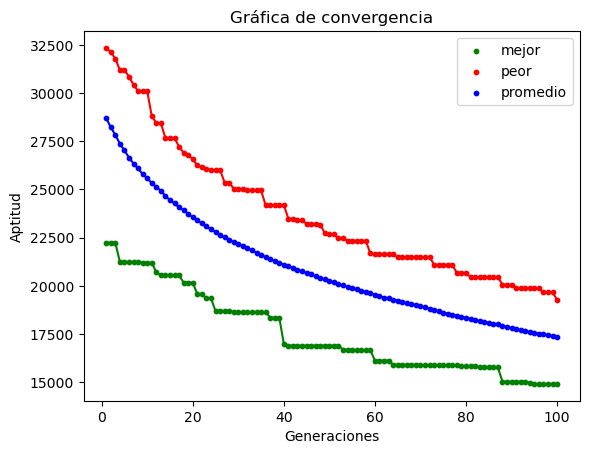

In [13]:
grafica(mejores, peores, promedio, maxiter)